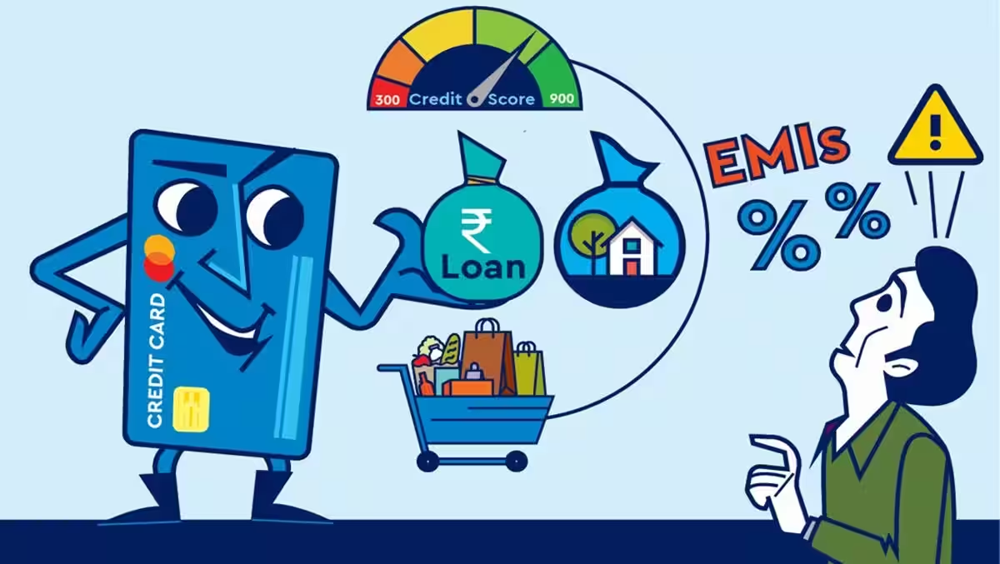

## Machine Learning Module: Credit Score Classification Deployment
## Model Deployment With Streamlit

### Problem Statement

You are working as a data scientist in a global finance company. Over the years, the company has collected basic bank details and gathered a lot of credit-related information. The management wants to build an intelligent system to segregate the people into credit score brackets to reduce the manual efforts.

### Task
Given a person’s credit-related information, build a machine learning model that can classify the credit score.

### Variable Description

    ID: Unique ID of the record
    Customer_ID: Unique ID of the customer
    Month: Month of the year
    Name: The name of the person
    Age: The age of the person
    SSN: Social Security Number of the person
    Occupation: The occupation of the person
    Annual_Income: The Annual Income of the person
    Monthly_Inhand_Salary: Monthly in-hand salary of the person
    Num_Bank_Accounts: The number of bank accounts of the person
    Num_Credit_Card: Number of credit cards the person is having
    Interest_Rate: The interest rate on the credit card of the person
    Num_of_Loan: The number of loans taken by the person from the bank
    Type_of_Loan: The types of loans taken by the person from the bank
    Delay_from_due_date: The average number of days delayed by the person from the date of payment
    Num_of_Delayed_Payment: Number of payments delayed by the person
    Changed_Credit_Card: The percentage change in the credit card limit of the person
    Num_Credit_Inquiries: The number of credit card inquiries by the person
    Credit_Mix: Classification of Credit Mix of the customer
    Outstanding_Debt: The outstanding balance of the person
    Credit_Utilization_Ratio: The credit utilization ratio of the credit card of the customer
    Credit_History_Age: The age of the credit history of the person
    Payment_of_Min_Amount: Yes if the person paid the minimum amount to be paid only, otherwise no.
    Total_EMI_per_month: The total EMI per month of the person
    Amount_invested_monthly: The monthly amount invested by the person
    Payment_Behaviour: The payment behaviour of the person
    Monthly_Balance: The monthly balance left in the account of the person
    Credit_Score: The credit score of the person

### Table of Contents

    1.Import Libraries
    2.Reading Clean the Data from File
    3.Multi-class Classification Data Pre-Processing
        A.Implement Logistic Regression Model
        B.Implement Random Forest Classifier Model
        C.Implement Xgboost Classifier Model
    4.Future Importance XGBoost
    5.Final Model

## Importing Libraries

In [1]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns
import plotly.express as px

from datetime import date,timedelta
import os
import pickle

from sklearn.preprocessing import LabelEncoder,OneHotEncoder
# Pre Processing
from sklearn.impute import SimpleImputer 
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score

## Reading Data

In [2]:


df = pd.read_csv('F:/data science/Final_Project_Criteria_Dataset/credit card/train.csv',low_memory=False)
df.head()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good


There are incorrectly entered values in age and Credit_Mix. Other variables may also have incorrectly entered values. We will examine it in detail.

## EDA & Some Cleaning

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      90015 non-null   object 
 4   Age                       100000 non-null  object 
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  object 
 8   Monthly_Inhand_Salary     84998 non-null   float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               100000 non-null  object 
 13  Type_of_Loan              88592 non-null   ob

In [4]:
df.shape

(100000, 28)

In [5]:
df

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,0x25fe9,CUS_0x942c,April,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,_,502.38,34.663572,31 Years and 6 Months,No,35.104023,60.97133255718485,High_spent_Large_value_payments,479.86622816574095,Poor
99996,0x25fea,CUS_0x942c,May,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,_,502.38,40.565631,31 Years and 7 Months,No,35.104023,54.18595028760385,High_spent_Medium_value_payments,496.651610435322,Poor
99997,0x25feb,CUS_0x942c,June,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,Good,502.38,41.255522,31 Years and 8 Months,No,35.104023,24.02847744864441,High_spent_Large_value_payments,516.8090832742814,Poor
99998,0x25fec,CUS_0x942c,July,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,Good,502.38,33.638208,31 Years and 9 Months,No,35.104023,251.67258219721603,Low_spent_Large_value_payments,319.1649785257098,Standard


In [6]:
df.describe()

,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Delay_from_due_date,Num_Credit_Inquiries,Credit_Utilization_Ratio,Total_EMI_per_month
count,84998.000000,100000.000000,100000.00000,100000.000000,100000.000000,98035.000000,100000.000000,100000.000000
mean,4194.170850,17.091280,22.47443,72.466040,21.068780,27.754251,32.285173,1403.118217
std,3183.686167,117.404834,129.05741,466.422621,14.860104,193.177339,5.116875,8306.041270
min,303.645417,-1.000000,0.00000,1.000000,-5.000000,0.000000,20.000000,0.000000
25%,1625.568229,3.000000,4.00000,8.000000,10.000000,3.000000,28.052567,30.306660
50%,3093.745000,6.000000,5.00000,13.000000,18.000000,6.000000,32.305784,69.249473
75%,5957.448333,7.000000,7.00000,20.000000,28.000000,9.000000,36.496663,161.224249
max,15204.633333,1798.000000,1499.00000,5797.000000,67.000000,2597.000000,50.000000,82331.000000


    1-Min of age value is -500. Age variables shouldn't have negative values.
    2-Min of Num_Bank_Accounts is -1. Num_Bank_Accounts variables shouldn't have negative values.
    3-Min of Num_of_Loan is -100. Num_of_Loan variables shouldn't have negative values.
    4-The customer may have paid his loan before the due date. Therefore Delay_from_due_date can contain negative values.
    5-Numerical variables include outlier values  

In [7]:
df.isna().mean()*100

ID                           0.000
Customer_ID                  0.000
Month                        0.000
Name                         9.985
Age                          0.000
SSN                          0.000
Occupation                   0.000
Annual_Income                0.000
Monthly_Inhand_Salary       15.002
Num_Bank_Accounts            0.000
Num_Credit_Card              0.000
Interest_Rate                0.000
Num_of_Loan                  0.000
Type_of_Loan                11.408
Delay_from_due_date          0.000
Num_of_Delayed_Payment       7.002
Changed_Credit_Limit         0.000
Num_Credit_Inquiries         1.965
Credit_Mix                   0.000
Outstanding_Debt             0.000
Credit_Utilization_Ratio     0.000
Credit_History_Age           9.030
Payment_of_Min_Amount        0.000
Total_EMI_per_month          0.000
Amount_invested_monthly      4.479
Payment_Behaviour            0.000
Monthly_Balance              1.200
Credit_Score                 0.000
dtype: float64

In [8]:
df['Name'].value_counts()

Name
Langep            44
Stevex            44
Vaughanl          39
Jessicad          39
Raymondr          38
                  ..
Alina Selyukhg     4
Habboushg          4
Mortimerq          4
Ronaldf            4
Timothyl           3
Name: count, Length: 10139, dtype: int64

In [9]:
df[df.duplicated("Name")]

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good
5,0x1607,CUS_0xd40,June,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,27.262259,22 Years and 6 Months,No,49.574949,62.430172331195294,!@9#%8,340.4792117872438,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,0x25fe9,CUS_0x942c,April,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,_,502.38,34.663572,31 Years and 6 Months,No,35.104023,60.97133255718485,High_spent_Large_value_payments,479.86622816574095,Poor
99996,0x25fea,CUS_0x942c,May,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,_,502.38,40.565631,31 Years and 7 Months,No,35.104023,54.18595028760385,High_spent_Medium_value_payments,496.651610435322,Poor
99997,0x25feb,CUS_0x942c,June,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,Good,502.38,41.255522,31 Years and 8 Months,No,35.104023,24.02847744864441,High_spent_Large_value_payments,516.8090832742814,Poor
99998,0x25fec,CUS_0x942c,July,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,Good,502.38,33.638208,31 Years and 9 Months,No,35.104023,251.67258219721603,Low_spent_Large_value_payments,319.1649785257098,Standard


In [10]:
df.drop_duplicates(inplace=True)

In [11]:
df.duplicated().sum()

0

In [12]:
df.describe(include = 'O')

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Num_of_Loan,Type_of_Loan,Num_of_Delayed_Payment,Changed_Credit_Limit,Credit_Mix,Outstanding_Debt,Credit_History_Age,Payment_of_Min_Amount,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
count,100000,100000,100000,90015,100000,100000,100000,100000,100000,88592,92998,100000,100000,100000,90970,100000,95521,100000,98800,100000
unique,100000,12500,8,10139,1788,12501,16,18940,434,6260,749,4384,4,13178,404,3,91049,7,98792,3
top,0x1602,CUS_0xd40,January,Langep,38,#F%$D@*&8,_______,36585.12,3,Not Specified,19,_,Standard,1360.45,15 Years and 11 Months,Yes,__10000__,Low_spent_Small_value_payments,__-333333333333333333333333333__,Standard
freq,1,8,12500,44,2833,5572,7062,16,14386,1408,5327,2091,36479,24,446,52326,4305,25513,9,53174


In [13]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Monthly_Inhand_Salary,84998.0,4194.170850,3183.686167,303.645417,1625.568229,3093.745000,5957.448333,15204.633333
Num_Bank_Accounts,100000.0,17.091280,117.404834,-1.000000,3.000000,6.000000,7.000000,1798.000000
Num_Credit_Card,100000.0,22.474430,129.057410,0.000000,4.000000,5.000000,7.000000,1499.000000
Interest_Rate,100000.0,72.466040,466.422621,1.000000,8.000000,13.000000,20.000000,5797.000000
Delay_from_due_date,100000.0,21.068780,14.860104,-5.000000,10.000000,18.000000,28.000000,67.000000
Num_Credit_Inquiries,98035.0,27.754251,193.177339,0.000000,3.000000,6.000000,9.000000,2597.000000
Credit_Utilization_Ratio,100000.0,32.285173,5.116875,20.000000,28.052567,32.305784,36.496663,50.000000
Total_EMI_per_month,100000.0,1403.118217,8306.041270,0.000000,30.306660,69.249473,161.224249,82331.000000


    1- The number of bank accounts of the person have very high maximum value. Also its minimum value is negative value. This variable do not include negative values.
    2-The number of credit card of the person have very high maximum value.
    3-The number of credit card inquiries by the person have very high maximum value.
    4-It can be observed that there are outlier observations in the data set.
     

In [14]:



#for col in ["Age", "Num_Bank_Accounts", "Num_of_Loan"]:
    # Convert the column to numeric (ignoring errors to handle non-numeric values)
    #df[col] = pd.to_numeric(df[col], errors='coerce')
    
    # Set values less than 0 to NaN
    #df.loc[df[col] < 0, col] = np.nan


In [15]:
df.describe()

,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Delay_from_due_date,Num_Credit_Inquiries,Credit_Utilization_Ratio,Total_EMI_per_month
count,84998.000000,100000.000000,100000.00000,100000.000000,100000.000000,98035.000000,100000.000000,100000.000000
mean,4194.170850,17.091280,22.47443,72.466040,21.068780,27.754251,32.285173,1403.118217
std,3183.686167,117.404834,129.05741,466.422621,14.860104,193.177339,5.116875,8306.041270
min,303.645417,-1.000000,0.00000,1.000000,-5.000000,0.000000,20.000000,0.000000
25%,1625.568229,3.000000,4.00000,8.000000,10.000000,3.000000,28.052567,30.306660
50%,3093.745000,6.000000,5.00000,13.000000,18.000000,6.000000,32.305784,69.249473
75%,5957.448333,7.000000,7.00000,20.000000,28.000000,9.000000,36.496663,161.224249
max,15204.633333,1798.000000,1499.00000,5797.000000,67.000000,2597.000000,50.000000,82331.000000


In [16]:

#for col in df.select_dtypes(np.number).columns:
    #plt.figure(figsize=(15, 5))
#plt.subplot(131)
   # sns.histplot(df[col], kde=True)
   # plt.title(f'Histogram of {col}')

    #plt.subplot(132)
    #sns.boxplot(df[col])
    #plt.title(f'Boxplot of {col}')
    
    #plt.subplot(133)
    #probplot(df[col], rvalue=True, plot=plt, dist='norm')
    #plt.title(f'Probability Plot of {col}')

    #plt.suptitle(col)
    #plt.show()

In [17]:
#for i in ["Age","Num_Bank_Accounts","Num_of_Loan"]:
    #df.loc[df[i]<0,i]=np.nan

In [18]:
df.drop(["ID","Customer_ID","Name","SSN"],axis=1,inplace=True)

In [19]:
df["Payment_Behaviour"].value_counts()

Payment_Behaviour
Low_spent_Small_value_payments      25513
High_spent_Medium_value_payments    17540
Low_spent_Medium_value_payments     13861
High_spent_Large_value_payments     13721
High_spent_Small_value_payments     11340
Low_spent_Large_value_payments      10425
!@9#%8                               7600
Name: count, dtype: int64

C:\Users\Acer\AppData\Local\Temp\ipykernel_18176\3321917912.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x="Payment_Behaviour",data=df,palette="inferno")


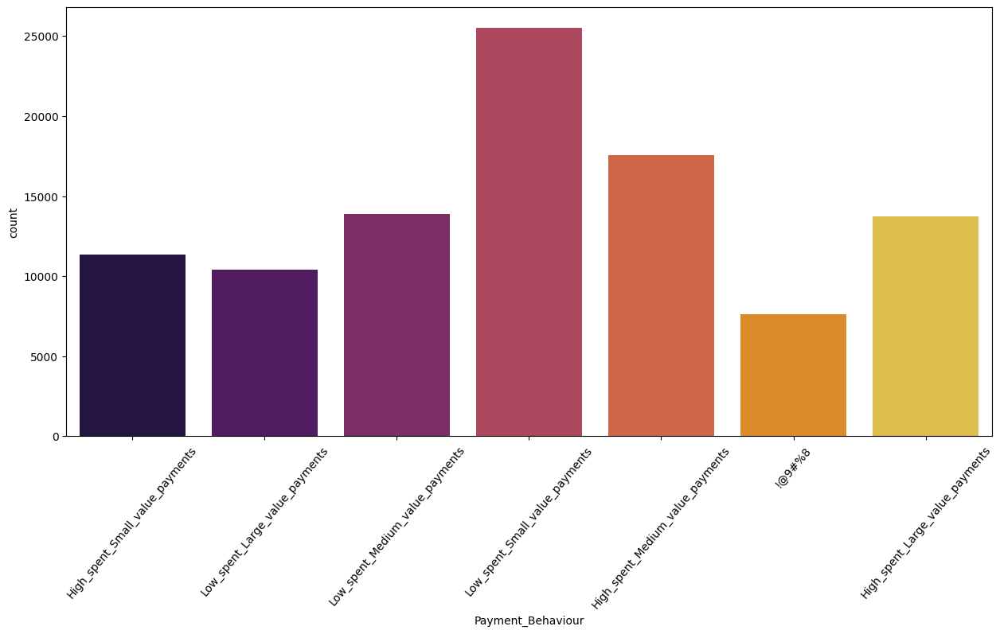

In [20]:
plt.figure(figsize=(15,7))
sns.countplot(x="Payment_Behaviour",data=df,palette="inferno")
plt.xticks(rotation=50)
plt.show()

In [21]:
df["Payment_Behaviour"]=df["Payment_Behaviour"].replace("!@9#%8",np.nan)
df["Payment_Behaviour"].value_counts()

Payment_Behaviour
Low_spent_Small_value_payments      25513
High_spent_Medium_value_payments    17540
Low_spent_Medium_value_payments     13861
High_spent_Large_value_payments     13721
High_spent_Small_value_payments     11340
Low_spent_Large_value_payments      10425
Name: count, dtype: int64

In [22]:
df["Month"].value_counts()

Month
January     12500
February    12500
March       12500
April       12500
May         12500
June        12500
July        12500
August      12500
Name: count, dtype: int64

In [23]:
df["Credit_History_Age"].value_counts()

Credit_History_Age
15 Years and 11 Months    446
19 Years and 4 Months     445
19 Years and 5 Months     444
17 Years and 11 Months    443
19 Years and 3 Months     441
                         ... 
0 Years and 3 Months       20
0 Years and 2 Months       15
33 Years and 7 Months      14
33 Years and 8 Months      12
0 Years and 1 Months        2
Name: count, Length: 404, dtype: int64

In [24]:
df["Credit_Mix"].value_counts()

Credit_Mix
Standard    36479
Good        24337
_           20195
Bad         18989
Name: count, dtype: int64

In [25]:
df["Credit_Mix"]=df["Credit_Mix"].replace("_",np.nan)
df["Credit_Mix"].value_counts()

Credit_Mix
Standard    36479
Good        24337
Bad         18989
Name: count, dtype: int64

C:\Users\Acer\AppData\Local\Temp\ipykernel_18176\637006124.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y="Credit_Mix",data=df,palette="tab20")


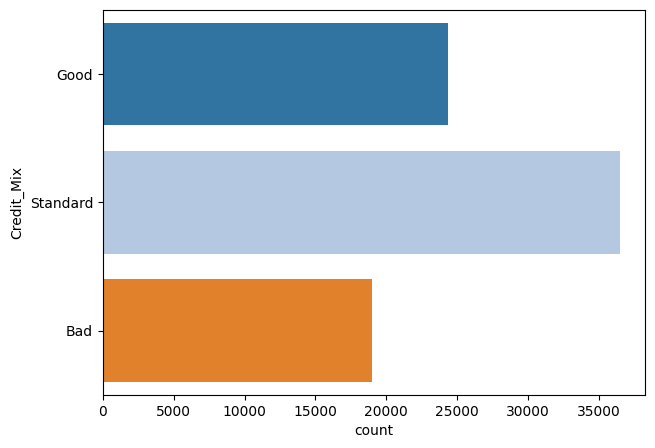

In [26]:
plt.figure(figsize=(7,5))
sns.countplot(y="Credit_Mix",data=df,palette="tab20")
plt.show()

In [27]:
df["Occupation"].value_counts()

Occupation
_______          7062
Lawyer           6575
Architect        6355
Engineer         6350
Scientist        6299
Mechanic         6291
Accountant       6271
Developer        6235
Media_Manager    6232
Teacher          6215
Entrepreneur     6174
Doctor           6087
Journalist       6085
Manager          5973
Musician         5911
Writer           5885
Name: count, dtype: int64

In [28]:
df["Occupation"]=df["Occupation"].replace("_______",np.nan)
df["Occupation"].value_counts()

Occupation
Lawyer           6575
Architect        6355
Engineer         6350
Scientist        6299
Mechanic         6291
Accountant       6271
Developer        6235
Media_Manager    6232
Teacher          6215
Entrepreneur     6174
Doctor           6087
Journalist       6085
Manager          5973
Musician         5911
Writer           5885
Name: count, dtype: int64

In [29]:
df['Payment_of_Min_Amount'].value_counts()

Payment_of_Min_Amount
Yes    52326
No     35667
NM     12007
Name: count, dtype: int64

In [30]:
df['Type_of_Loan'].value_counts()

Type_of_Loan
Not Specified                                                                                                                         1408
Credit-Builder Loan                                                                                                                   1280
Personal Loan                                                                                                                         1272
Debt Consolidation Loan                                                                                                               1264
Student Loan                                                                                                                          1240
                                                                                                                                      ... 
Not Specified, Mortgage Loan, Auto Loan, and Payday Loan                                                                                 8
Payday Loan, M

In [31]:
df['Type_of_Loan'].value_counts().head(10)

Type_of_Loan
Not Specified                      1408
Credit-Builder Loan                1280
Personal Loan                      1272
Debt Consolidation Loan            1264
Student Loan                       1240
Payday Loan                        1200
Mortgage Loan                      1176
Auto Loan                          1152
Home Equity Loan                   1136
Personal Loan, and Student Loan     320
Name: count, dtype: int64

In [32]:
df.drop(["Type_of_Loan"],axis=1,inplace=True)

In [33]:
#import pandas as pd
#import seaborn as sns
#import matplotlib.pyplot as plt

# Assuming df is your DataFrame
#numeric_df = df.select_dtypes(include='number')  # Select only numeric columns

#plt.figure(figsize=(20, 15))
#sns.heatmap(numeric_df.corr(), annot=True, fmt=".2f", cmap="jet")
#plt.show()

In [34]:
# correlation analysis
#df_corr=df_corr=df.select_dtypes(include=["float64","int64"]).corr()

#plt.figure(figsize=(15,12))
#plt.title("correlation matrix", color="red",fontsize=15)
#sns.heatmap(df_corr,annot=True,cmap="Blues",fmt=".2f")
#sns.set(font_scale=1,style='white')
#plt.show()

    There is a moderate positive correlation between Delay_from_due_date and Outstanding_Depdt
    There is a moderate positive correlation between Changed_Credict_Limit and Outstanding_Depdt

In [35]:
#plt.figure(figsize=(15,15))
#for ax, col in enumerate(numeric_df):
    #plt.subplot(5,4, ax+1)
    #plt.title(col)
    #sns.kdeplot(x=df[col],shade=True, hue=df["Credit_Score"])
    #plt.legend()

#plt.tight_layout()

In [36]:
#import seaborn as sns
#import matplotlib.pyplot as plt

# Assuming 'col' is a categorical variable
#for ax, col in enumerate(df.columns):
   # plt.subplot(5, 4, ax + 1)
    #plt.title(col)
    
    # Use 'hue' for additional differentiation
    #sns.countplot(x=df[col], hue=df["Credit_Score"])
    
    #plt.legend()

#plt.tight_layout()
#plt.show()


In [37]:
# The features "Delay_from_due_date" and "Num_Bank_Accounts" have negative values which is not possible.
df = df[df.Delay_from_due_date >= 0]
df = df[df.Num_Bank_Accounts >= 0]
df.shape

(99388, 23)

In [38]:


# Assuming df is your DataFrame
# Convert 'Age' column to numeric (if it contains string values)
#df['Age'] = pd.to_numeric(df['Age'], errors='coerce')

# Define bins and labels for age groups
#age_bins = [14, 25, 35, 45, 55, 65, 75]
#age_labels = ['14-24', '25-34', '35-44', '45-54', '55-64', '65-74']

# Create the "Grouped_Age" column
#df['Grouped_Age'] = pd.cut(df['Age'], bins=age_bins, labels=age_labels, right=False)

# Display the first few rows to verify the new column
#print(df[['Age', 'Grouped_Age']].head(30))


In [39]:
df['Changed_Credit_Limit'] = df['Changed_Credit_Limit'].replace('_',np.nan)  # Replace '_' with 0
df['Age'] = df['Age'].replace('-500',np.nan)

In [40]:
#df['Credit_Utilization_Ratio'] = pd.to_numeric(df['Credit_Utilization_Ratio'], errors='coerce')

In [41]:
#df['Changed_Credit_Limit'] = pd.to_numeric(df['Changed_Credit_Limit'], errors='coerce')

In [42]:
#df['Grouped_Age'] = pd.to_numeric(df['Grouped_Age'], errors='coerce')

In [43]:

df["Age"].nunique()

1781

In [44]:
df.isna().mean()*100

Month                        0.000000
Age                          0.886425
Occupation                   7.050147
Annual_Income                0.000000
Monthly_Inhand_Salary       14.997786
Num_Bank_Accounts            0.000000
Num_Credit_Card              0.000000
Interest_Rate                0.000000
Num_of_Loan                  0.000000
Delay_from_due_date          0.000000
Num_of_Delayed_Payment       7.007888
Changed_Credit_Limit         2.096833
Num_Credit_Inquiries         1.963014
Credit_Mix                  20.202640
Outstanding_Debt             0.000000
Credit_Utilization_Ratio     0.000000
Credit_History_Age           9.019197
Payment_of_Min_Amount        0.000000
Total_EMI_per_month          0.000000
Amount_invested_monthly      4.482432
Payment_Behaviour            7.597497
Monthly_Balance              1.199340
Credit_Score                 0.000000
dtype: float64

In [45]:
df.dropna(subset=["Amount_invested_monthly","Monthly_Balance","Age","Changed_Credit_Limit","Num_Credit_Inquiries","Payment_Behaviour","Credit_History_Age","Num_of_Delayed_Payment"], inplace=True)

In [46]:
df.isna().mean()*100

Month                        0.000000
Age                          0.000000
Occupation                   7.096820
Annual_Income                0.000000
Monthly_Inhand_Salary       14.955600
Num_Bank_Accounts            0.000000
Num_Credit_Card              0.000000
Interest_Rate                0.000000
Num_of_Loan                  0.000000
Delay_from_due_date          0.000000
Num_of_Delayed_Payment       0.000000
Changed_Credit_Limit         0.000000
Num_Credit_Inquiries         0.000000
Credit_Mix                  20.285019
Outstanding_Debt             0.000000
Credit_Utilization_Ratio     0.000000
Credit_History_Age           0.000000
Payment_of_Min_Amount        0.000000
Total_EMI_per_month          0.000000
Amount_invested_monthly      0.000000
Payment_Behaviour            0.000000
Monthly_Balance              0.000000
Credit_Score                 0.000000
dtype: float64

In [47]:

# Assuming df is your DataFrame
# Convert 'Age' column to numeric (if it contains string values)
#df['Age'] = pd.to_numeric(df['Age'], errors='coerce')

#Define bins and labels for age groups
#age_bins = [14, 25, 35, 45, 55, 65, 75]
#age_labels = ['14-24', '25-34', '35-44', '45-54', '55-64', '65-74']

# Create the "Grouped_Age" column
#df['Grouped_Age'] = pd.cut(df['Age'], bins=age_bins, labels=age_labels, right=False)

# Display the first few rows to verify the new column
#print(df[['Age', 'Grouped_Age']].head(30))

In [48]:
df

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,January,23,Scientist,19114.12,1824.843333,3,4,3,4,3,...,NaN,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
3,April,23,Scientist,19114.12,NaN,3,4,3,4,5,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
6,July,23,Scientist,19114.12,1824.843333,3,4,3,4,3,...,Good,809.98,22.537593,22 Years and 7 Months,No,49.574949,178.3440674122349,Low_spent_Small_value_payments,244.5653167062043,Good
8,January,28_,NaN,34847.84,3037.986667,2,4,6,1,3,...,Good,605.03,24.464031,26 Years and 7 Months,No,18.816215,104.291825168246,Low_spent_Small_value_payments,470.69062692529184,Standard
9,February,28,Teacher,34847.84,3037.986667,2,4,6,1,7,...,Good,605.03,38.550848,26 Years and 8 Months,No,18.816215,40.39123782853101,High_spent_Large_value_payments,484.5912142650067,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99991,August,29,Architect,20002.88,1929.906667,10,8,29,5,33,...,Bad,3571.7,37.140784,6 Years and 3 Months,Yes,60.964772,34.66290609052614,High_spent_Large_value_payments,337.3629882027182,Standard
99994,March,25,Mechanic,39628.99,3359.415833,4,6,7,2,20,...,NaN,502.38,39.323569,31 Years and 5 Months,No,35.104023,140.58140274528395,High_spent_Medium_value_payments,410.2561579776419,Poor
99995,April,25,Mechanic,39628.99,3359.415833,4,6,7,2,23,...,NaN,502.38,34.663572,31 Years and 6 Months,No,35.104023,60.97133255718485,High_spent_Large_value_payments,479.86622816574095,Poor
99996,May,25,Mechanic,39628.99,3359.415833,4,6,7,2,18,...,NaN,502.38,40.565631,31 Years and 7 Months,No,35.104023,54.18595028760385,High_spent_Medium_value_payments,496.651610435322,Poor


In [49]:
df.dtypes

Month                        object
Age                          object
Occupation                   object
Annual_Income                object
Monthly_Inhand_Salary       float64
Num_Bank_Accounts             int64
Num_Credit_Card               int64
Interest_Rate                 int64
Num_of_Loan                  object
Delay_from_due_date           int64
Num_of_Delayed_Payment       object
Changed_Credit_Limit         object
Num_Credit_Inquiries        float64
Credit_Mix                   object
Outstanding_Debt             object
Credit_Utilization_Ratio    float64
Credit_History_Age           object
Payment_of_Min_Amount        object
Total_EMI_per_month         float64
Amount_invested_monthly      object
Payment_Behaviour            object
Monthly_Balance              object
Credit_Score                 object
dtype: object

Skewness of Monthly_Inhand_Salary: 1.1452859434053555
Kurtosis of Monthly_Inhand_Salary: 0.6667336213848252


posx and posy should be finite values
posx and posy should be finite values


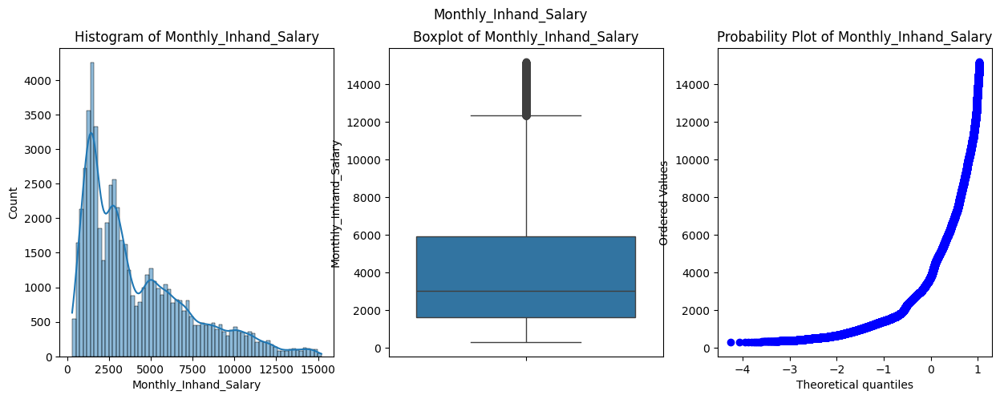

Skewness of Num_Bank_Accounts: 11.207145799012942
Kurtosis of Num_Bank_Accounts: 132.63374171019262


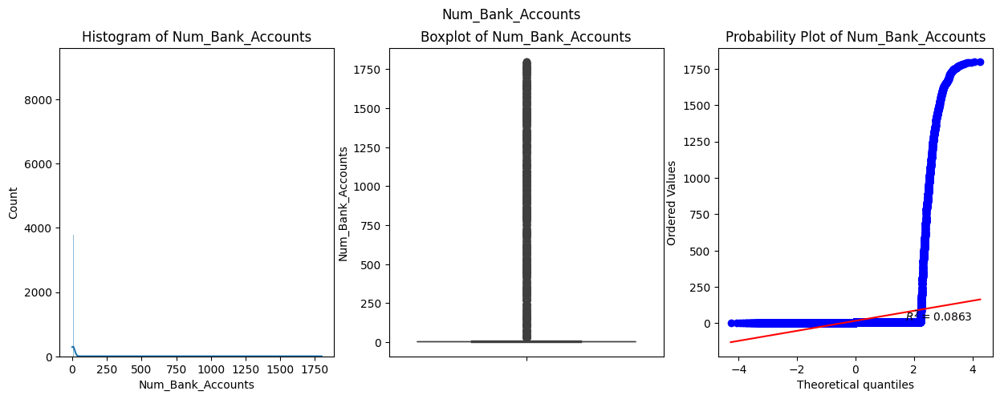

Skewness of Num_Credit_Card: 8.406551358092853
Kurtosis of Num_Credit_Card: 73.69875038706162


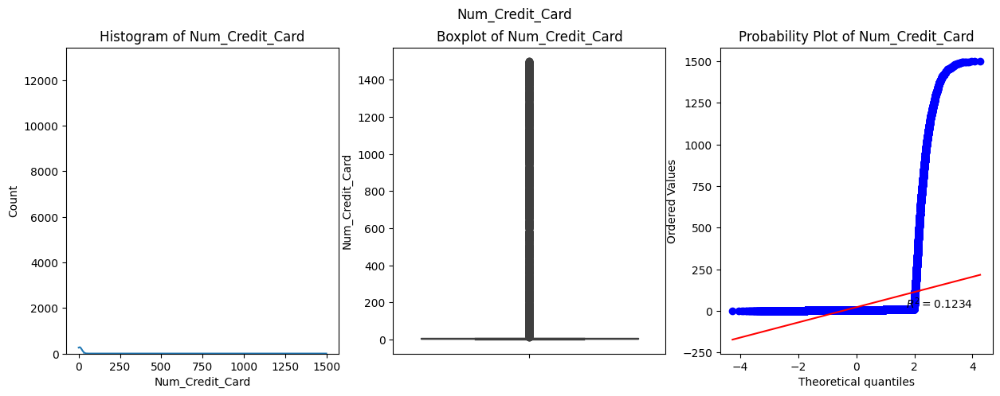

Skewness of Interest_Rate: 8.964691914676578
Kurtosis of Interest_Rate: 84.20666980107215


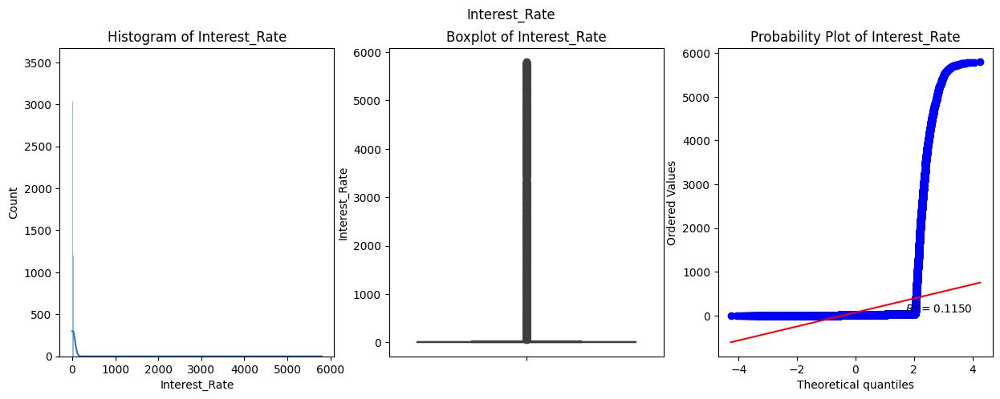

Skewness of Delay_from_due_date: 0.9849490779302401
Kurtosis of Delay_from_due_date: 0.3589539536330566


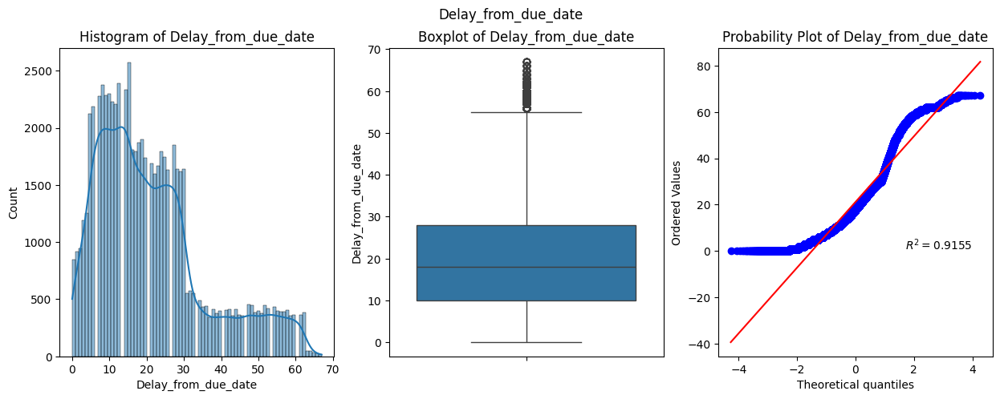

Skewness of Num_Credit_Inquiries: 9.997510372399368
Kurtosis of Num_Credit_Inquiries: 105.45105825978398


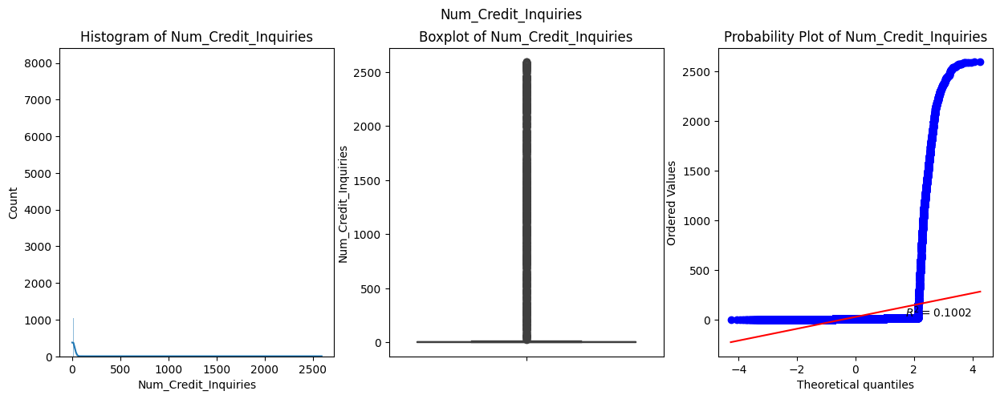

Skewness of Credit_Utilization_Ratio: 0.026311570691861977
Kurtosis of Credit_Utilization_Ratio: -0.9406528784997374


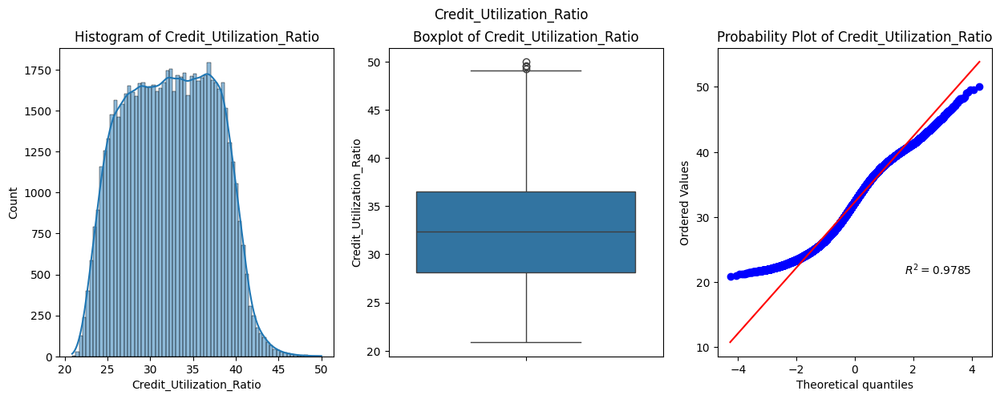

Skewness of Total_EMI_per_month: 7.017184708222451
Kurtosis of Total_EMI_per_month: 50.983494127223864


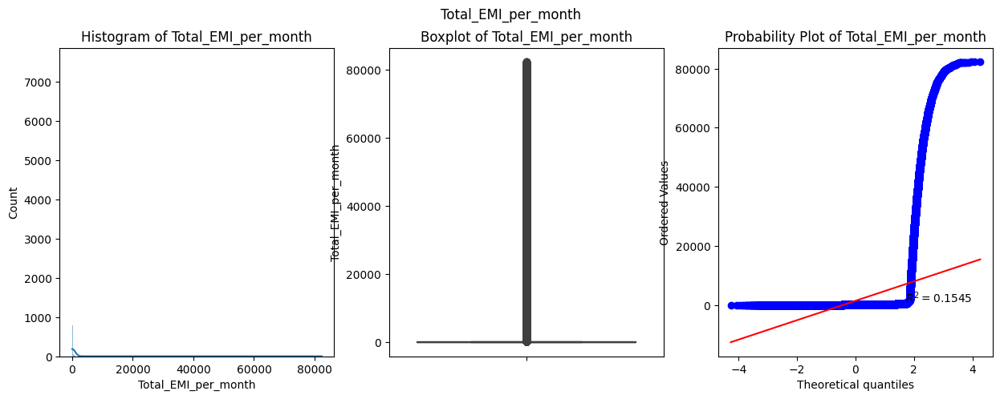

In [50]:
import seaborn as sns
from scipy.stats import probplot  # Import probplot here
import matplotlib.pyplot as plt

# Your code goes here
for col in df.select_dtypes(np.number).columns:
    print(f"Skewness of {col}:",df[col].skew())
    print(f"Kurtosis of {col}:",df[col].kurtosis())
    plt.figure(figsize=(15, 5))
    
    plt.subplot(131)
    sns.histplot(df[col], kde=True)
    plt.title(f'Histogram of {col}')

    plt.subplot(132)
    sns.boxplot(df[col])
    plt.title(f'Boxplot of {col}')

    plt.subplot(133)
    probplot(df[col], rvalue=True, plot=plt, dist='norm')
    plt.title(f'Probability Plot of {col}')

    plt.suptitle(col)
    plt.show()


Most of the features have highly right-skewed distributions having several outliers so they need to be transformed appropriately in order to make them resemble the normal distribution to a larger extent.

In [51]:
#import seaborn as sns
#import matplotlib.pyplot as plt
#from scipy.stats import probplot  # Import probplot from scipy.stats



# Now iterate over numeric columns
#for col in df.select_dtypes(np.number).columns:
   # plt.figure(figsize=(15, 5))

    #plt.subplot(131)
    #sns.histplot(df[col], kde=True)
    #plt.title(f'Histogram of {col}')

    #plt.subplot(132)
   # sns.boxplot(df[col])
    #plt.title(f'Boxplot of {col}')

    #plt.subplot(133)
    #probplot(df[col], rvalue=True, plot=plt, dist='norm')
    #plt.title(f'Probability Plot of {col}')

    #plt.suptitle(col)
    #plt.show()


C:\Users\Acer\AppData\Local\Temp\ipykernel_18176\3455194459.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y="Credit_Score",data=df,palette="tab20")


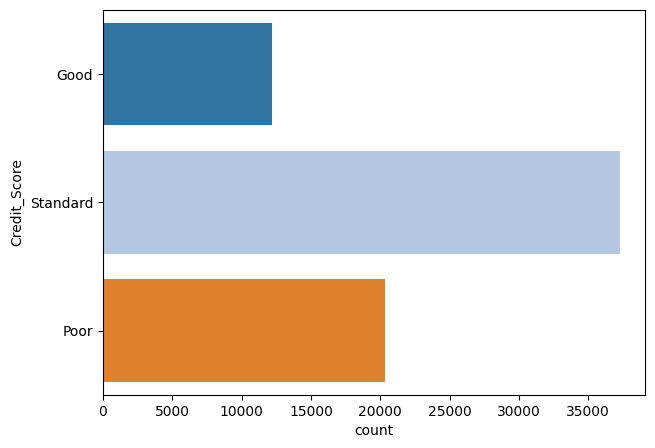

In [52]:
plt.figure(figsize=(7,5))
sns.countplot(y="Credit_Score",data=df,palette="tab20")
plt.show()

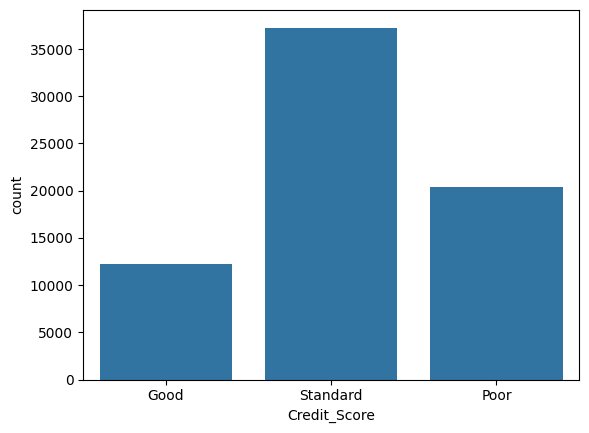

In [53]:
sns.countplot(x='Credit_Score',data=df);

The target label classes of the feature "Credit_Score" are quite imbalanced as clearly indicated by the above figure. Hence, they need to be balanced out later by using over-sampling techniques to prevent degradation of the performance of machine learning algorithms.

In [54]:
#for col in df.select_dtypes(np.number).columns:
       # print(f"Skewness of {col}:",df[col].skew())
        #print(f"Kurtosis of {col}:",df[col].kurtosis())
        #plt.figure(figsize=(14,4))
        #plt.subplot(131)
        #sns.distplot(df[col])
        #plt.subplot(132)
        #sns.boxplot(df[col])
        #plt.subplot(133)
        #probplot(df[col],rvalue=True,plot=plt,dist='norm')
        #plt.suptitle(col)
        #plt.show();

In [55]:
df

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,January,23,Scientist,19114.12,1824.843333,3,4,3,4,3,...,NaN,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
3,April,23,Scientist,19114.12,NaN,3,4,3,4,5,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
6,July,23,Scientist,19114.12,1824.843333,3,4,3,4,3,...,Good,809.98,22.537593,22 Years and 7 Months,No,49.574949,178.3440674122349,Low_spent_Small_value_payments,244.5653167062043,Good
8,January,28_,NaN,34847.84,3037.986667,2,4,6,1,3,...,Good,605.03,24.464031,26 Years and 7 Months,No,18.816215,104.291825168246,Low_spent_Small_value_payments,470.69062692529184,Standard
9,February,28,Teacher,34847.84,3037.986667,2,4,6,1,7,...,Good,605.03,38.550848,26 Years and 8 Months,No,18.816215,40.39123782853101,High_spent_Large_value_payments,484.5912142650067,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99991,August,29,Architect,20002.88,1929.906667,10,8,29,5,33,...,Bad,3571.7,37.140784,6 Years and 3 Months,Yes,60.964772,34.66290609052614,High_spent_Large_value_payments,337.3629882027182,Standard
99994,March,25,Mechanic,39628.99,3359.415833,4,6,7,2,20,...,NaN,502.38,39.323569,31 Years and 5 Months,No,35.104023,140.58140274528395,High_spent_Medium_value_payments,410.2561579776419,Poor
99995,April,25,Mechanic,39628.99,3359.415833,4,6,7,2,23,...,NaN,502.38,34.663572,31 Years and 6 Months,No,35.104023,60.97133255718485,High_spent_Large_value_payments,479.86622816574095,Poor
99996,May,25,Mechanic,39628.99,3359.415833,4,6,7,2,18,...,NaN,502.38,40.565631,31 Years and 7 Months,No,35.104023,54.18595028760385,High_spent_Medium_value_payments,496.651610435322,Poor


In [56]:
df.describe()

,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Delay_from_due_date,Num_Credit_Inquiries,Credit_Utilization_Ratio,Total_EMI_per_month
count,59378.000000,69820.000000,69820.000000,69820.000000,69820.000000,69820.000000,69820.000000,69820.000000
mean,4150.709245,17.088284,22.711487,73.271283,21.175924,26.874320,32.318833,1424.906476
std,3164.832005,117.335278,129.722121,471.373966,14.799570,188.427473,5.105015,8357.646045
min,303.645417,0.000000,0.000000,1.000000,0.000000,0.000000,20.881250,0.000000
25%,1617.173333,4.000000,4.000000,8.000000,10.000000,3.000000,28.096273,30.214229
50%,3049.970000,6.000000,6.000000,14.000000,18.000000,6.000000,32.349338,68.539914
75%,5909.745000,7.000000,7.000000,20.000000,28.000000,9.000000,36.511503,156.920956
max,15204.633333,1798.000000,1499.000000,5797.000000,67.000000,2594.000000,50.000000,82331.000000


In [57]:
df["Payment_of_Min_Amount"].value_counts()

Payment_of_Min_Amount
Yes    36739
No     24718
NM      8363
Name: count, dtype: int64

In [58]:
df["Monthly_Balance"].value_counts()

Monthly_Balance
__-333333333333333333333333333__    7
312.49408867943663                  1
311.24270027482504                  1
823.8832256580185                   1
825.7787723225616                   1
                                   ..
613.4145465045096                   1
195.77015787387245                  1
586.1116737224835                   1
425.59068554426887                  1
516.8090832742814                   1
Name: count, Length: 69814, dtype: int64

In [59]:
df["Changed_Credit_Limit"].value_counts()

Changed_Credit_Limit
8.22                   95
10.06                  94
11.32                  93
11.5                   91
11.49                  87
                       ..
28.35                   1
25.46                   1
0.6799999999999999      1
-1.8200000000000005     1
21.17                   1
Name: count, Length: 4177, dtype: int64

In [60]:

#Plot Distrbution with Credit_Score
#import matplotlib.pyplot as plt

#def plot_stacked_bar(data, x_label, y_label):
    #fig, ax = plt.subplots()
    #data.plot(kind='bar', stacked=True, ax=ax)
   #ax.set_xlabel(x_label)
    #ax.set_ylabel(y_label)
    #plt.show()

# Now you can use the plot_stacked_bar function
#plot_stacked_bar(df, "Month", "Credit_Score")


C:\Users\Acer\AppData\Local\Temp\ipykernel_18176\4091002629.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['Monthly_Inhand_Salary'])


<Axes: xlabel='Monthly_Inhand_Salary', ylabel='Density'>

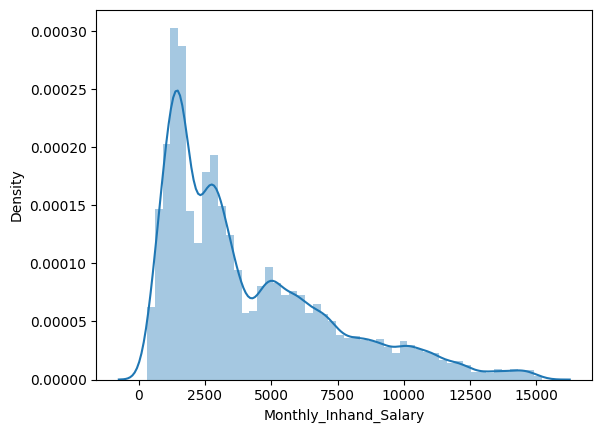

In [61]:
sns.distplot(df['Monthly_Inhand_Salary'])

C:\Users\Acer\AppData\Local\Temp\ipykernel_18176\631128562.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['Num_Bank_Accounts']);


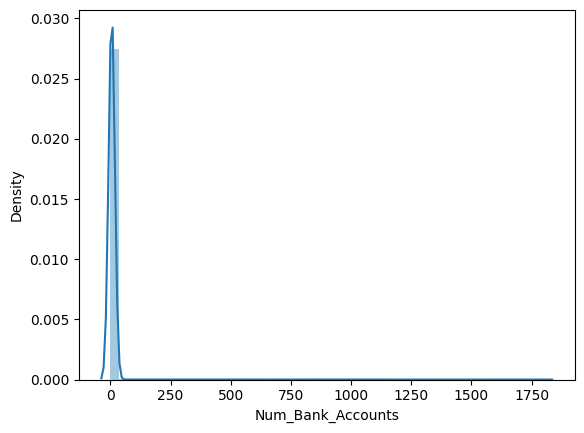

In [62]:
sns.distplot(df['Num_Bank_Accounts']);

In [63]:
df[df['Num_Bank_Accounts']==0].head()

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
48,January,33,Lawyer,131313.4,11242.783333,0,1,8,2,0,...,Good,352.16,32.200509,30 Years and 7 Months,NM,137.644605,378.1712535207537,High_spent_Medium_value_payments,858.462474411158,Good
50,March,34,Lawyer,131313.4,10469.207759,0,1,8,2,0,...,Good,352.16,31.803134,30 Years and 9 Months,NM,911.220179,188.06432109973838,High_spent_Large_value_payments,1038.5694068321734,Good
51,April,34,Lawyer,131313.4,10469.207759,0,1,8,2,0,...,Good,352.16,42.645785,30 Years and 10 Months,No,23834.000000,337.43495631738324,High_spent_Medium_value_payments,899.1987716145285,Good
52,May,34,Lawyer,131313.4,10469.207759,0,1,8,2,0,...,Good,352.16,40.902517,30 Years and 11 Months,No,32662.000000,263.3789089320552,High_spent_Large_value_payments,963.2548189998564,Good
53,June,34,Lawyer,131313.4,NaN,0,1,8,-100,0,...,Good,352.16,41.980170,31 Years and 0 Months,No,911.220179,86.56638801207531,High_spent_Large_value_payments,1140.0673399198365,Standard


There is a sizable number of records with zero bank accounts and Loan Type gave no concrete conclusion so it is assumed to be correct.

C:\Users\Acer\AppData\Local\Temp\ipykernel_18176\173875541.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['Delay_from_due_date']);


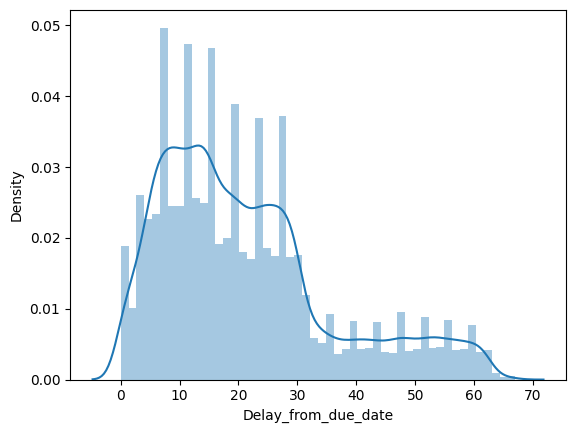

In [64]:
sns.distplot(df['Delay_from_due_date']);

C:\Users\Acer\AppData\Local\Temp\ipykernel_18176\480478915.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['Credit_Utilization_Ratio'])


<Axes: xlabel='Credit_Utilization_Ratio', ylabel='Density'>

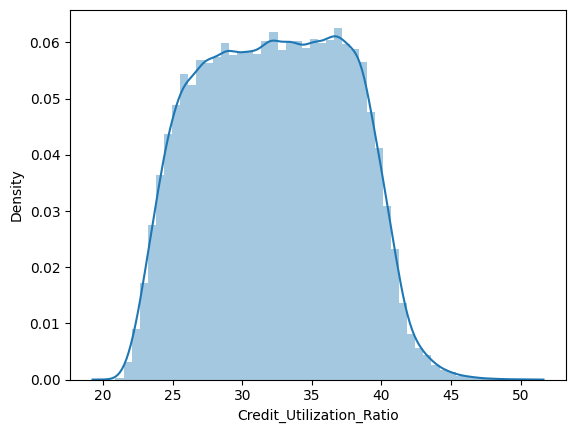

In [65]:
sns.distplot(df['Credit_Utilization_Ratio'])

In [66]:
## Rebuild Type of loans Columns 
#for i in df['Type_of_Loan'].value_counts().head(9).index[1:] : 
    #df[i] = df['Type_of_Loan'].str.contains(i)

#del df['Type_of_Loan']

In [67]:
#px.histogram(df, x='Num_Credit_Card', text_auto='d',
             #width=800, height=400, title="Distribution of Credit Cards Owned per Person")

In [68]:
import plotly.express as px

# Assuming df is your DataFrame
fig = px.histogram(df, x='Payment_of_Min_Amount',
                   labels={'Payment_of_Min_Amount': 'Payment of Minimum Amount'},
                   width=800, height=400, title="Distribution of Loan Payment Behaviour")

fig.show()


There is an undefined value NM which we will consider as 'Not Minimum'.

In [69]:
df['Payment_of_Min_Amount'].replace('NM','No',inplace=True)

In [70]:
import plotly.io as pio
pio.templates.default = "plotly_dark"
px.histogram(df, x='Payment_of_Min_Amount',
             width=800, height=400, title="Distribution of Loan Payment Behaviour")

In [71]:
px.histogram(df, x='Monthly_Inhand_Salary',
                width=1200, height=400, title="Monthly Income Distribution")

In [72]:
df['Monthly_Balance'].nunique()

69814

In [73]:
df['Num_of_Loan'].nunique()

311

In [74]:
df['Changed_Credit_Limit'].nunique()

4177

In [75]:
df['Outstanding_Debt'].nunique()

12908

In [76]:
df['Credit_History_Age'].nunique()

404

In [77]:
df['Annual_Income'].nunique()

17246

In [78]:
df['Num_of_Delayed_Payment'].nunique()

589

In [79]:
df['Amount_invested_monthly'].nunique()

66549

In [80]:
df['Credit_Score'].nunique()

3

In [81]:
#for col in num_cols:
    #sns.boxplot(x=df[col])
    #plt.show()
#plt.show()

In [82]:
df['Num_Credit_Card'].nunique()

1003

In [83]:
df["Num_of_Delayed_Payment"].nunique()

589

In [84]:
df["Num_of_Delayed_Payment"].value_counts()

Num_of_Delayed_Payment
17      3961
19      3952
16      3935
15      3869
18      3860
        ... 
4219       1
2860       1
1608       1
823        1
2047       1
Name: count, Length: 589, dtype: int64

In [85]:
df["Amount_invested_monthly"].value_counts()

Amount_invested_monthly
__10000__             3145
0.0                    128
360.60569078700416       1
176.15926314239934       1
216.2649832084086        1
                      ... 
550.9039398646433        1
173.8248087166011        1
209.66228838589214       1
161.60800181219938       1
24.02847744864441        1
Name: count, Length: 66549, dtype: int64

In [86]:
features_to_be_num=['Outstanding_Debt','Annual_Income','Amount_invested_monthly','Monthly_Balance']
for feature in features_to_be_num:
    df[feature] = df[feature].str.extract(r'(\d+\.\d+)').astype(float)

df    

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,January,23,Scientist,19114.12,1824.843333,3,4,3,4,3,...,NaN,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.415295,High_spent_Small_value_payments,312.494089,Good
3,April,23,Scientist,19114.12,NaN,3,4,3,4,5,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.458074,Low_spent_Small_value_payments,223.451310,Good
6,July,23,Scientist,19114.12,1824.843333,3,4,3,4,3,...,Good,809.98,22.537593,22 Years and 7 Months,No,49.574949,178.344067,Low_spent_Small_value_payments,244.565317,Good
8,January,28_,NaN,34847.84,3037.986667,2,4,6,1,3,...,Good,605.03,24.464031,26 Years and 7 Months,No,18.816215,104.291825,Low_spent_Small_value_payments,470.690627,Standard
9,February,28,Teacher,34847.84,3037.986667,2,4,6,1,7,...,Good,605.03,38.550848,26 Years and 8 Months,No,18.816215,40.391238,High_spent_Large_value_payments,484.591214,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99991,August,29,Architect,20002.88,1929.906667,10,8,29,5,33,...,Bad,3571.70,37.140784,6 Years and 3 Months,Yes,60.964772,34.662906,High_spent_Large_value_payments,337.362988,Standard
99994,March,25,Mechanic,39628.99,3359.415833,4,6,7,2,20,...,NaN,502.38,39.323569,31 Years and 5 Months,No,35.104023,140.581403,High_spent_Medium_value_payments,410.256158,Poor
99995,April,25,Mechanic,39628.99,3359.415833,4,6,7,2,23,...,NaN,502.38,34.663572,31 Years and 6 Months,No,35.104023,60.971333,High_spent_Large_value_payments,479.866228,Poor
99996,May,25,Mechanic,39628.99,3359.415833,4,6,7,2,18,...,NaN,502.38,40.565631,31 Years and 7 Months,No,35.104023,54.185950,High_spent_Medium_value_payments,496.651610,Poor


In [87]:
num_cols = df.select_dtypes(exclude= 'object').columns
num_cols

Index(['Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Interest_Rate', 'Delay_from_due_date',
       'Num_Credit_Inquiries', 'Outstanding_Debt', 'Credit_Utilization_Ratio',
       'Total_EMI_per_month', 'Amount_invested_monthly', 'Monthly_Balance'],
      dtype='object')

In [88]:
cat_cols = df.select_dtypes(include= 'object').columns
cat_cols


Index(['Month', 'Age', 'Occupation', 'Num_of_Loan', 'Num_of_Delayed_Payment',
       'Changed_Credit_Limit', 'Credit_Mix', 'Credit_History_Age',
       'Payment_of_Min_Amount', 'Payment_Behaviour', 'Credit_Score'],
      dtype='object')

In [89]:
df["Amount_invested_monthly"].nunique()

66548

In [90]:
df["Credit_History_Age"].nunique()

404

In [91]:
df['Credit_History_Age'].value_counts()

Credit_History_Age
19 Years and 4 Months     357
17 Years and 11 Months    349
15 Years and 10 Months    349
19 Years and 5 Months     346
17 Years and 10 Months    344
                         ... 
0 Years and 3 Months       16
33 Years and 7 Months      14
0 Years and 2 Months       11
33 Years and 8 Months      10
0 Years and 1 Months        2
Name: count, Length: 404, dtype: int64

In [92]:
df['Amount_invested_monthly'].value_counts()

Amount_invested_monthly
0.000000      128
80.415295       1
176.159263      1
216.264983      1
190.054978      1
             ... 
550.903940      1
173.824809      1
209.662288      1
161.608002      1
24.028477       1
Name: count, Length: 66548, dtype: int64

In [93]:
#df["Age_Group"].nunique()

In [94]:
df["Credit_Utilization_Ratio"].value_counts()

Credit_Utilization_Ratio
26.822620    1
38.948429    1
31.341189    1
41.296971    1
36.092684    1
            ..
32.025867    1
26.533297    1
32.236402    1
26.617112    1
41.255522    1
Name: count, Length: 69820, dtype: int64

In [95]:
df["Changed_Credit_Limit"].nunique()

4177

In [96]:
df["Changed_Credit_Limit"].value_counts()

Changed_Credit_Limit
8.22                   95
10.06                  94
11.32                  93
11.5                   91
11.49                  87
                       ..
28.35                   1
25.46                   1
0.6799999999999999      1
-1.8200000000000005     1
21.17                   1
Name: count, Length: 4177, dtype: int64

In [97]:
#df['Annual_Income'] = pd.to_numeric(df['Annual_Income'], errors='coerce')
#df['Monthly_Balance'] = pd.to_numeric(df['Monthly_Balance'], errors='coerce')
#df['Outstanding_Debt'] = pd.to_numeric(df['Outstanding_Debt'].str.replace(r'[^0-9.]', '', regex=True), errors='coerce')
df['Interest_Rate'] = pd.to_numeric(df['Interest_Rate'], errors='coerce')
df['Changed_Credit_Limit'] = pd.to_numeric(df['Changed_Credit_Limit'], errors='coerce')
df["Num_of_Loan"] = pd.to_numeric(df["Num_of_Loan"], errors="coerce")
df['Delay_from_due_date'] = pd.to_numeric(df['Delay_from_due_date'], errors='coerce')
df['Total_EMI_per_month'] = pd.to_numeric(df['Total_EMI_per_month'], errors='coerce')
df['Num_of_Delayed_Payment'] = pd.to_numeric(df['Num_of_Delayed_Payment'], errors='coerce')
#df['Amount_invested_monthly'] = pd.to_numeric(df['Amount_invested_monthly'], errors='coerce')

In [98]:
df.dtypes

Month                        object
Age                          object
Occupation                   object
Annual_Income               float64
Monthly_Inhand_Salary       float64
Num_Bank_Accounts             int64
Num_Credit_Card               int64
Interest_Rate                 int64
Num_of_Loan                 float64
Delay_from_due_date           int64
Num_of_Delayed_Payment      float64
Changed_Credit_Limit        float64
Num_Credit_Inquiries        float64
Credit_Mix                   object
Outstanding_Debt            float64
Credit_Utilization_Ratio    float64
Credit_History_Age           object
Payment_of_Min_Amount        object
Total_EMI_per_month         float64
Amount_invested_monthly     float64
Payment_Behaviour            object
Monthly_Balance             float64
Credit_Score                 object
dtype: object

In [99]:
df.isnull().mean()*100

Month                        0.000000
Age                          0.000000
Occupation                   7.096820
Annual_Income                0.000000
Monthly_Inhand_Salary       14.955600
Num_Bank_Accounts            0.000000
Num_Credit_Card              0.000000
Interest_Rate                0.000000
Num_of_Loan                  4.763678
Delay_from_due_date          0.000000
Num_of_Delayed_Payment       2.916070
Changed_Credit_Limit         0.000000
Num_Credit_Inquiries         0.000000
Credit_Mix                  20.285019
Outstanding_Debt             0.000000
Credit_Utilization_Ratio     0.000000
Credit_History_Age           0.000000
Payment_of_Min_Amount        0.000000
Total_EMI_per_month          0.000000
Amount_invested_monthly      4.504440
Payment_Behaviour            0.000000
Monthly_Balance              0.010026
Credit_Score                 0.000000
dtype: float64

In [100]:
#main['Num_Credit_Card'].replace(0,1,inplace=True)

In [101]:
#for col in num_cols:
    #sns.boxplot(x=df[col])
    #plt.show()
#plt.show()

In [102]:
df["Num_Credit_Card"].value_counts()

Num_Credit_Card
5       12793
7       11692
6       11571
4        9865
3        9243
        ...  
374         1
1148        1
825         1
1240        1
679         1
Name: count, Length: 1003, dtype: int64

In [103]:
df["Credit_History_Age"].value_counts()

Credit_History_Age
19 Years and 4 Months     357
17 Years and 11 Months    349
15 Years and 10 Months    349
19 Years and 5 Months     346
17 Years and 10 Months    344
                         ... 
0 Years and 3 Months       16
33 Years and 7 Months      14
0 Years and 2 Months       11
33 Years and 8 Months      10
0 Years and 1 Months        2
Name: count, Length: 404, dtype: int64

In [104]:
import pandas as pd

# Assuming df is your DataFrame

# Convert 'Age' column to numeric values, coerce errors to NaN for non-numeric entries
df['Age'] = pd.to_numeric(df['Age'], errors='coerce')

# Define the function to assign age groups
def assign_age_group(row):
    if pd.notna(row['Age']):  # Check if the value is not NaN
        if int(row['Age']) <= 17:
            return '0_Teen'
        elif int(row['Age']) <= 30:
            return '1_Young Adult'
        elif int(row['Age']) <= 45:
            return '2_Adult'
        else:
            return '3_Old-aged'
    

# Apply the function to create the 'Age_Group' column
df['Age_Group'] = df.apply(assign_age_group, axis=1)


In [105]:
# Create Age Group column
#def assign_age_group(row):
  #if row['Age'] <= 17:
  # return '0_Teen'
  #elif row['Age'] <= 30:
   #return '1_Young Adult'
  #elif row['Age'] <= 45:
    #return '2_Middled-aged'
  #else:
    #return '3_Old-aged'

#df['Age_group'] = df.apply(assign_age_group, axis=1)

In [106]:
df['Age_Group'].value_counts()

Age_Group
2_Adult          27746
1_Young Adult    24185
3_Old-aged       10575
0_Teen            3842
Name: count, dtype: int64

In [107]:
px.histogram(df.sort_values('Age_Group'), y='Age_Group', color='Credit_Score', barnorm='percent',
             color_discrete_sequence=px.colors.qualitative.Vivid,
             width=800, height=400, title='Credit Score Proportion by Age Groups')

By breaking up into Age Groups and normalize the distribution, we can clearly observe that as an individual gets older they will be more likely to have better Credit Score. There is correlation but we may not yet understand the cause.

<Axes: xlabel='Age_Group', ylabel='count'>

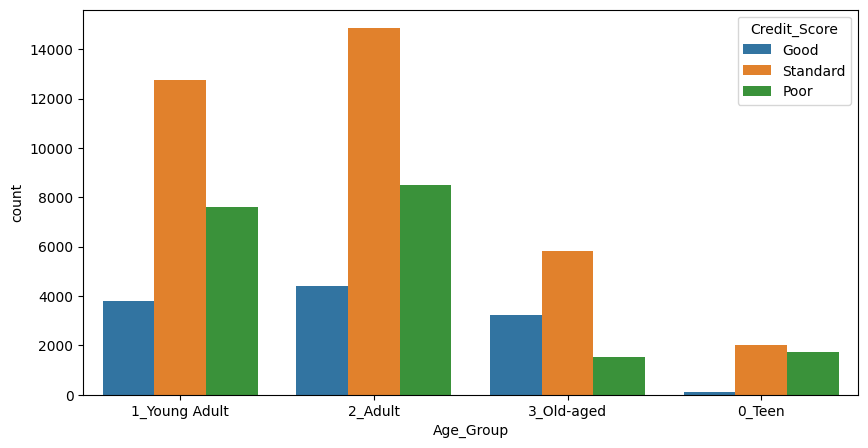

In [108]:
# Now, use the filtered DataFrame for the countplot
plt.figure(figsize=(10,5))
sns.countplot(data=df, x='Age_Group', hue='Credit_Score')

In [109]:
import plotly.express as px
import pandas as pd

# Assuming df is your DataFrame
df = df.dropna(subset=['Age_Group'])  # Drop rows with NaN values in 'Age_Group'
df = df[df['Age_Group'] != '']  # Drop rows with empty strings in 'Age_Group'

# Create the box plot
fig = px.box(df.sort_values('Age_Group'), x='Monthly_Inhand_Salary', y='Age_Group', color='Age_Group',
             color_discrete_sequence=px.colors.sequential.Burgyl,
             width=1000, height=500, title='Income Distribution by Age Group')
fig.update_layout(showlegend=False)

# Show the plot
fig.show()


In [110]:
#fig = px.box(df.sort_values('Age_Group'), x='Monthly_Inhand_Salary', y='Age_Group', color='Age_Group',
             #color_discrete_sequence=px.colors.sequential.Burgyl,
             #width=1000, height=500, title='Income Distribution by Age Group')
#fig.update_layout(showlegend=False)

The graph above shows what we expected. There is correlation between Age and Income. Older people will generally be higher in their career

In [111]:
fig = px.box(df, x='Monthly_Inhand_Salary', y='Credit_Score', color='Credit_Score',
             color_discrete_sequence=px.colors.qualitative.Vivid,
             width=1000, height=500, title='Monthly Salary Distribution by Credit Score')
fig.update_layout(showlegend=False)

Although we can see that Income has a positive effect on Credit Score, the amount of outliers at the upper whiskers for Stanard and Poor Credit Score are quite substantial. There are alot of high income individuals who has low Credit Score

In [112]:
px.box(df, y='Monthly_Inhand_Salary', x='Occupation',
       width=1200, height=500, title='Income Distribution by Occupation')

Surprisingly there is almost no difference in Income between the jobs

   Debt to Income Ratio:
   
    "The debt-to-income (DTI) ratio is the percentage of your gross monthly income that goes to paying your monthly debt payments and is used by lenders to determine your borrowing risk." - https://www.investopedia.com/terms/d/dti.asp

In [113]:
# Create Delay Group column
def assign_delay_group(row):
  if row['Delay_from_due_date'] <= 4:
    return '0_Up to 4days'
  elif row['Delay_from_due_date'] <= 15:
    return '1_Over 4days'
  elif row['Delay_from_due_date'] <= 30:
    return '2_Over 15days'
  else:
    return '3_Over 30days'

df['Delay_Group'] = df.apply(assign_delay_group, axis=1)

In [114]:
px.histogram(df.sort_values(['Delay_Group', 'Credit_Score']), y='Delay_Group', color='Credit_Score', barnorm='percent',
             color_discrete_sequence=px.colors.qualitative.Vivid,
             width=800, height=400, title='Credit Score Proportion by Days Late from Due Group')

We can see a clear gradual increase in Poor Scorer as the number of days over payment date increase and a big jump after 30 days. This is inline to what we assumed as it is a very important signifier for reliability.

In [115]:
from sklearn.impute import SimpleImputer
num_cols=['Age','Annual_Income','Monthly_Inhand_Salary','Num_Bank_Accounts','Num_Credit_Card','Interest_Rate','Num_of_Loan','Delay_from_due_date','Num_Credit_Inquiries','Outstanding_Debt','Credit_Utilization_Ratio','Total_EMI_per_month','Monthly_Balance','Num_of_Delayed_Payment','Amount_invested_monthly','Changed_Credit_Limit']
# Create a SimpleImputer with strategy='mean'
imputer = SimpleImputer(strategy='mean')
for column in num_cols:
    # Reshape the column to a 2D array
    column_data = df[column].values.reshape(-1, 1)
    # Apply the imputer
    df[column] = imputer.fit_transform(column_data)


In [116]:

from sklearn.impute import KNNImputer

# List of numeric columns to impute
num_cols=['Age','Annual_Income','Monthly_Inhand_Salary','Num_Bank_Accounts','Num_Credit_Card','Interest_Rate','Num_of_Loan','Delay_from_due_date','Num_Credit_Inquiries','Outstanding_Debt','Credit_Utilization_Ratio','Total_EMI_per_month','Monthly_Balance','Num_of_Delayed_Payment','Amount_invested_monthly','Changed_Credit_Limit']

# Initialize the KNNImputer
imputer = KNNImputer(n_neighbors=2)

# Reshape and impute each numeric column
for column in num_cols:
    # Reshape the column to a 2D array
    column_data = df[column].values.reshape(-1, 1)
    # Apply the imputer
    df[column] = imputer.fit_transform(column_data)

# Now the missing values in the numeric columns have been imputed

In [117]:
#Label Encoding
from sklearn.preprocessing import LabelEncoder

cat_cols=['Month', 'Occupation', 
'Credit_Mix', 'Credit_History_Age', 'Payment_of_Min_Amount',
       'Payment_Behaviour',
       'Age_Group', 'Delay_Group',"Credit_Score"]
# Initialize the LabelEncoder
label_encoder = LabelEncoder()

# Loop through each column and apply label encoding
for column in cat_cols:
    df[column] = label_encoder.fit_transform(df[column])

In [118]:
num_cols

['Age',
 'Annual_Income',
 'Monthly_Inhand_Salary',
 'Num_Bank_Accounts',
 'Num_Credit_Card',
 'Interest_Rate',
 'Num_of_Loan',
 'Delay_from_due_date',
 'Num_Credit_Inquiries',
 'Outstanding_Debt',
 'Credit_Utilization_Ratio',
 'Total_EMI_per_month',
 'Monthly_Balance',
 'Num_of_Delayed_Payment',
 'Amount_invested_monthly',
 'Changed_Credit_Limit']

In [119]:
df

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,...,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score,Age_Group,Delay_Group
0,3,23.0,12,19114.12,1824.843333,3.0,4.0,3.0,4.0,3.0,...,26.822620,180,0,49.574949,80.415295,2,312.494089,0,1,0
3,0,23.0,12,19114.12,4153.160598,3.0,4.0,3.0,4.0,5.0,...,31.377862,185,0,49.574949,199.458074,5,223.451310,0,1,1
6,4,23.0,12,19114.12,1824.843333,3.0,4.0,3.0,4.0,3.0,...,22.537593,188,0,49.574949,178.344067,5,244.565317,0,1,0
9,2,28.0,13,34847.84,3037.986667,2.0,4.0,6.0,1.0,7.0,...,38.550848,237,0,18.816215,40.391238,0,484.591214,0,1,1
10,6,28.0,13,34847.84,3037.986667,2.0,1385.0,6.0,1.0,3.0,...,33.224951,238,0,18.816215,58.515976,0,466.466476,2,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99991,1,29.0,1,20002.88,1929.906667,10.0,8.0,29.0,5.0,33.0,...,37.140784,361,1,60.964772,34.662906,0,337.362988,2,1,3
99994,6,25.0,9,39628.99,3359.415833,4.0,6.0,7.0,2.0,20.0,...,39.323569,306,0,35.104023,140.581403,1,410.256158,1,1,2
99995,0,25.0,9,39628.99,3359.415833,4.0,6.0,7.0,2.0,23.0,...,34.663572,307,0,35.104023,60.971333,0,479.866228,1,1,2
99996,7,25.0,9,39628.99,3359.415833,4.0,6.0,7.0,2.0,18.0,...,40.565631,308,0,35.104023,54.185950,1,496.651610,1,1,2


## Data Splitting

In [120]:
X = df.drop(['Credit_Score'], axis=1)
y = df['Credit_Score']

In [121]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 42)

In [122]:
num_cols

['Age',
 'Annual_Income',
 'Monthly_Inhand_Salary',
 'Num_Bank_Accounts',
 'Num_Credit_Card',
 'Interest_Rate',
 'Num_of_Loan',
 'Delay_from_due_date',
 'Num_Credit_Inquiries',
 'Outstanding_Debt',
 'Credit_Utilization_Ratio',
 'Total_EMI_per_month',
 'Monthly_Balance',
 'Num_of_Delayed_Payment',
 'Amount_invested_monthly',
 'Changed_Credit_Limit']

In [123]:
cat_cols

['Month',
 'Occupation',
 'Credit_Mix',
 'Credit_History_Age',
 'Payment_of_Min_Amount',
 'Payment_Behaviour',
 'Age_Group',
 'Delay_Group',
 'Credit_Score']

In [124]:
df["Credit_Mix"].nunique()

4

In [125]:
df["Num_of_Delayed_Payment"].nunique()

524

In [126]:
df["Num_of_Delayed_Payment"].value_counts()

Num_of_Delayed_Payment
19.0      3766
17.0      3754
16.0      3736
18.0      3682
15.0      3675
          ... 
4024.0       1
1531.0       1
4219.0       1
2860.0       1
2047.0       1
Name: count, Length: 524, dtype: int64

In [127]:
df["Annual_Income"].nunique()

13142

In [128]:
df

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,...,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score,Age_Group,Delay_Group
0,3,23.0,12,19114.12,1824.843333,3.0,4.0,3.0,4.0,3.0,...,26.822620,180,0,49.574949,80.415295,2,312.494089,0,1,0
3,0,23.0,12,19114.12,4153.160598,3.0,4.0,3.0,4.0,5.0,...,31.377862,185,0,49.574949,199.458074,5,223.451310,0,1,1
6,4,23.0,12,19114.12,1824.843333,3.0,4.0,3.0,4.0,3.0,...,22.537593,188,0,49.574949,178.344067,5,244.565317,0,1,0
9,2,28.0,13,34847.84,3037.986667,2.0,4.0,6.0,1.0,7.0,...,38.550848,237,0,18.816215,40.391238,0,484.591214,0,1,1
10,6,28.0,13,34847.84,3037.986667,2.0,1385.0,6.0,1.0,3.0,...,33.224951,238,0,18.816215,58.515976,0,466.466476,2,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99991,1,29.0,1,20002.88,1929.906667,10.0,8.0,29.0,5.0,33.0,...,37.140784,361,1,60.964772,34.662906,0,337.362988,2,1,3
99994,6,25.0,9,39628.99,3359.415833,4.0,6.0,7.0,2.0,20.0,...,39.323569,306,0,35.104023,140.581403,1,410.256158,1,1,2
99995,0,25.0,9,39628.99,3359.415833,4.0,6.0,7.0,2.0,23.0,...,34.663572,307,0,35.104023,60.971333,0,479.866228,1,1,2
99996,7,25.0,9,39628.99,3359.415833,4.0,6.0,7.0,2.0,18.0,...,40.565631,308,0,35.104023,54.185950,1,496.651610,1,1,2


In [129]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 66348 entries, 0 to 99997
Data columns (total 25 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Month                     66348 non-null  int32  
 1   Age                       66348 non-null  float64
 2   Occupation                66348 non-null  int32  
 3   Annual_Income             66348 non-null  float64
 4   Monthly_Inhand_Salary     66348 non-null  float64
 5   Num_Bank_Accounts         66348 non-null  float64
 6   Num_Credit_Card           66348 non-null  float64
 7   Interest_Rate             66348 non-null  float64
 8   Num_of_Loan               66348 non-null  float64
 9   Delay_from_due_date       66348 non-null  float64
 10  Num_of_Delayed_Payment    66348 non-null  float64
 11  Changed_Credit_Limit      66348 non-null  float64
 12  Num_Credit_Inquiries      66348 non-null  float64
 13  Credit_Mix                66348 non-null  int32  
 14  Outstanding

In [130]:
print(df.columns)

Index(['Month', 'Age', 'Occupation', 'Annual_Income', 'Monthly_Inhand_Salary',
       'Num_Bank_Accounts', 'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Credit_Mix', 'Outstanding_Debt',
       'Credit_Utilization_Ratio', 'Credit_History_Age',
       'Payment_of_Min_Amount', 'Total_EMI_per_month',
       'Amount_invested_monthly', 'Payment_Behaviour', 'Monthly_Balance',
       'Credit_Score', 'Age_Group', 'Delay_Group'],
      dtype='object')


In [131]:
# Downcast numerical columns to float32
df[num_cols] = df[num_cols].astype('float32')


In [132]:
df['Num_Bank_Accounts'] = df['Num_Bank_Accounts'].apply(lambda x :abs (x))

In [133]:

df['Num_Credit_Card'] = df['Num_Credit_Card'].apply(lambda x :abs (x))

In [134]:
df["Num_Credit_Card"].value_counts()

Num_Credit_Card
5.0       12139
7.0       11135
6.0       10973
4.0        9354
3.0        8814
          ...  
1148.0        1
825.0         1
1240.0        1
204.0         1
232.0         1
Name: count, Length: 979, dtype: int64

In [135]:
cat_cols

['Month',
 'Occupation',
 'Credit_Mix',
 'Credit_History_Age',
 'Payment_of_Min_Amount',
 'Payment_Behaviour',
 'Age_Group',
 'Delay_Group',
 'Credit_Score']

In [136]:
df["Payment_of_Min_Amount"].value_counts()

Payment_of_Min_Amount
1    34912
0    31436
Name: count, dtype: int64

In [137]:
df["Occupation"].value_counts()

Occupation
15    4722
7     4347
13    4225
1     4203
4     4202
9     4196
5     4153
12    4124
0     4117
10    4111
2     4091
3     4031
6     4029
8     3984
11    3945
14    3868
Name: count, dtype: int64

In [138]:
df["Payment_Behaviour"].value_counts()

Payment_Behaviour
5    17937
1    12816
0     9945
4     9926
2     8228
3     7496
Name: count, dtype: int64

In [139]:
df.dtypes

Month                         int32
Age                         float32
Occupation                    int32
Annual_Income               float32
Monthly_Inhand_Salary       float32
Num_Bank_Accounts           float64
Num_Credit_Card             float64
Interest_Rate               float32
Num_of_Loan                 float32
Delay_from_due_date         float32
Num_of_Delayed_Payment      float32
Changed_Credit_Limit        float32
Num_Credit_Inquiries        float32
Credit_Mix                    int32
Outstanding_Debt            float32
Credit_Utilization_Ratio    float32
Credit_History_Age            int32
Payment_of_Min_Amount         int32
Total_EMI_per_month         float32
Amount_invested_monthly     float32
Payment_Behaviour             int32
Monthly_Balance             float32
Credit_Score                  int32
Age_Group                     int32
Delay_Group                   int32
dtype: object

## Data Preprocessing

In [140]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import KNNImputer
from category_encoders import BinaryEncoder
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import StandardScaler, OneHotEncoder

# Assuming num_cols and cat_cols are defined
num_cols=['Age', 'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan',
       'Delay_from_due_date', 'Num_Credit_Inquiries', 'Outstanding_Debt',
       'Credit_Utilization_Ratio', 'Total_EMI_per_month', 'Monthly_Balance',"Num_of_Delayed_Payment","Amount_invested_monthly","Changed_Credit_Limit"]
cat_cols=['Month', 'Occupation', 
       'Credit_Mix', 'Credit_History_Age', 'Payment_of_Min_Amount',
       'Payment_Behaviour',
       'Age_Group', 'Delay_Group']
# Create transformers for numeric and categorical columns
numerical_transformer = Pipeline(steps=[('Impute Num', KNNImputer()), 
                                        ('imputer', SimpleImputer(strategy='mean')),
                                         ('scaler', StandardScaler())])
categorical_transformer = Pipeline(steps=[('impute', SimpleImputer(strategy='most_frequent')),
    ('OHE', OneHotEncoder(drop= 'first', sparse_output= False))])

# Create a column transformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, num_cols),
        ('cat', categorical_transformer, cat_cols)
    ])

# Create a pipeline with the preprocessor
pipeline = Pipeline(steps=[('preprocessor', preprocessor)])

# Fit and transform the data
x_train_processed = pipeline.fit_transform(x_train)
x_test_processed = pipeline.transform(x_test)

In [141]:
x_train_processed[0]

array([-0.14314245, -0.10002784, -0.57121653, -0.11191159, -0.14389748,
       -0.13367354,  0.02117087, -0.62137968, -0.1074999 , -1.20923383,
       -0.25145422, -0.15663812, -0.37448397, -0.06537323, -0.712698  ,
       -0.17696351,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  1.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  1.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  1.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.  

In [142]:
df

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,...,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score,Age_Group,Delay_Group
0,3,23.0,12,19114.119141,1824.843384,3.0,4.0,3.0,4.0,3.0,...,26.822620,180,0,49.574947,80.415298,2,312.494080,0,1,0
3,0,23.0,12,19114.119141,4153.160645,3.0,4.0,3.0,4.0,5.0,...,31.377861,185,0,49.574947,199.458069,5,223.451309,0,1,1
6,4,23.0,12,19114.119141,1824.843384,3.0,4.0,3.0,4.0,3.0,...,22.537594,188,0,49.574947,178.344070,5,244.565323,0,1,0
9,2,28.0,13,34847.839844,3037.986572,2.0,4.0,6.0,1.0,7.0,...,38.550850,237,0,18.816216,40.391239,0,484.591217,0,1,1
10,6,28.0,13,34847.839844,3037.986572,2.0,1385.0,6.0,1.0,3.0,...,33.224949,238,0,18.816216,58.515976,0,466.466461,2,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99991,1,29.0,1,20002.880859,1929.906616,10.0,8.0,29.0,5.0,33.0,...,37.140785,361,1,60.964771,34.662907,0,337.362976,2,1,3
99994,6,25.0,9,39628.988281,3359.415771,4.0,6.0,7.0,2.0,20.0,...,39.323570,306,0,35.104023,140.581406,1,410.256165,1,1,2
99995,0,25.0,9,39628.988281,3359.415771,4.0,6.0,7.0,2.0,23.0,...,34.663570,307,0,35.104023,60.971333,0,479.866241,1,1,2
99996,7,25.0,9,39628.988281,3359.415771,4.0,6.0,7.0,2.0,18.0,...,40.565632,308,0,35.104023,54.185951,1,496.651611,1,1,2


In [143]:
# Create Num Pipeline
 #from sklearn.pipeline import Pipeline
#from sklearn.impute import KNNImputer
#from sklearn.preprocessing import RobustScaler

#num_pipeline = Pipeline(steps= [ ('Impute Num', KNNImputer()), ('Scaling', RobustScaler()) ])
#num_pipeline

In [144]:
# Create Nominal Pipeline
#from sklearn.impute import SimpleImputer
#from sklearn.preprocessing import OneHotEncoder

#Nominal_pipeline = Pipeline(steps= [ ('Impute Nominal', SimpleImputer(strategy= 'most_frequent')), ('OHE', OneHotEncoder(drop= 'first', sparse_output= False)) ])
#Nominal_pipeline

In [145]:
# Create Ordinal Pipeline
#from sklearn.impute import SimpleImputer
#from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder

#Ordinal_pipeline = Pipeline(steps= [ ('Impute Ordinal', SimpleImputer(strategy= 'most_frequent')), ('OE', OrdinalEncoder(categories= [['Minor', 'Major']])) ])
#Ordinal_pipeline

In [146]:
x_train

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,...,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Age_Group,Delay_Group
63668,7,18.0,6,33127.310,2484.609167,4.0,4.0,10.0,4.0,12.0,...,37.21,31.034344,322,0,106.818686,60.129584,0,321.512646,1,1
75703,1,49.0,15,36603.850,3204.320833,4.0,5.0,7.0,4.0,16.0,...,1127.32,26.385476,259,1,106.366606,136.023278,1,328.042200,3,2
12110,4,43.0,2,16632.745,4153.160598,0.0,3.0,6.0,1.0,3.0,...,1415.37,34.498203,172,0,7.991650,94.020806,3,288.893752,2,0
38715,0,43.0,0,57153.630,4641.802500,4.0,4.0,9.0,2.0,18.0,...,529.63,41.113336,96,1,86.219908,175.008942,5,492.951399,2,2
40545,2,31.0,15,33643.540,3048.628333,4.0,6.0,20.0,5.0,12.0,...,1300.70,29.574208,90,1,70.536064,291.012931,5,233.313839,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56000,3,35.0,0,14115.220,1309.268333,6.0,5.0,16.0,9.0,21.0,...,3346.41,25.103349,146,1,96.775892,38.989851,1,245.161090,2,2
9494,4,24.0,9,68988.680,5942.056667,5.0,4.0,7.0,2.0,9.0,...,1106.06,25.572971,316,0,101.358131,716.332313,5,66.515223,1,1
82704,3,45.0,0,10482.625,912.552083,3.0,4.0,12.0,7.0,4.0,...,144.95,24.828001,69,1,61.002025,42.683718,5,277.569465,2,0
1337,2,36.0,8,68935.260,5518.605000,1.0,5.0,8.0,3.0,14.0,...,457.81,34.690138,222,0,102.796309,187.738869,1,584.147140,2,1


In [147]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 66348 entries, 0 to 99997
Data columns (total 25 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Month                     66348 non-null  int32  
 1   Age                       66348 non-null  float32
 2   Occupation                66348 non-null  int32  
 3   Annual_Income             66348 non-null  float32
 4   Monthly_Inhand_Salary     66348 non-null  float32
 5   Num_Bank_Accounts         66348 non-null  float64
 6   Num_Credit_Card           66348 non-null  float64
 7   Interest_Rate             66348 non-null  float32
 8   Num_of_Loan               66348 non-null  float32
 9   Delay_from_due_date       66348 non-null  float32
 10  Num_of_Delayed_Payment    66348 non-null  float32
 11  Changed_Credit_Limit      66348 non-null  float32
 12  Num_Credit_Inquiries      66348 non-null  float32
 13  Credit_Mix                66348 non-null  int32  
 14  Outstanding

In [148]:
print(df.columns)


Index(['Month', 'Age', 'Occupation', 'Annual_Income', 'Monthly_Inhand_Salary',
       'Num_Bank_Accounts', 'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Credit_Mix', 'Outstanding_Debt',
       'Credit_Utilization_Ratio', 'Credit_History_Age',
       'Payment_of_Min_Amount', 'Total_EMI_per_month',
       'Amount_invested_monthly', 'Payment_Behaviour', 'Monthly_Balance',
       'Credit_Score', 'Age_Group', 'Delay_Group'],
      dtype='object')


In [149]:
# Now we have some null values
pd.DataFrame(df.isnull().mean()*100, columns=['% null values'])

,% null values
Month,0.0
Age,0.0
Occupation,0.0
Annual_Income,0.0
Monthly_Inhand_Salary,0.0
Num_Bank_Accounts,0.0
Num_Credit_Card,0.0
Interest_Rate,0.0
Num_of_Loan,0.0
Delay_from_due_date,0.0


In [150]:
cat_cols

['Month',
 'Occupation',
 'Credit_Mix',
 'Credit_History_Age',
 'Payment_of_Min_Amount',
 'Payment_Behaviour',
 'Age_Group',
 'Delay_Group']

# MODELS BUILDING

    Target label is imbalanced.
    Data is mostly non Gaussian distribution.
    Data has a lot of overlapping between classes.
    Features are not independent.
    Linear models is ineffective because complex non-linear relationship. SVM is time consuming because of large dataset size.
    Features are not text data and independent of each other so Naive Bayes is ineffective.

## LogisticRegression

In [151]:
# Base Model
from sklearn.linear_model import LogisticRegression
model_1 = LogisticRegression(solver='liblinear', random_state=1)
model_1.fit(x_train_processed, y_train)  # ====> Weights
print('LogisticRegression Training Accuracy: ', round(model_1.score(x_train_processed, y_train), 2))

print('LogisticRegression Testing Accuracy: ', round(model_1.score(x_test_processed, y_test), 2))

LogisticRegression Training Accuracy:  0.63
LogisticRegression Testing Accuracy:  0.63


In [152]:
from sklearn.metrics import classification_report

model_1.fit(x_train_processed, y_train)
print(classification_report(y_train, model_1.predict(x_train_processed), target_names=['Good', 'Standard',"Poor"], zero_division=0))

              precision    recall  f1-score   support

        Good       0.52      0.56      0.54      9211
    Standard       0.64      0.50      0.56     15542
        Poor       0.67      0.73      0.70     28325

    accuracy                           0.63     53078
   macro avg       0.61      0.60      0.60     53078
weighted avg       0.63      0.63      0.63     53078



In [ ]:
!pip install imbalanced-learn


## Handle Imbalanced

In [ ]:
# Handle Imbalanced
#from imblearn.over_sampling import SMOTE

#sampler = SMOTE()

#x_sample, y_sample = sampler.fit_resample(x_train_processed, y_train)

In [ ]:
#y_sample.value_counts()

In [ ]:
#model_1.fit(x_train_processed, y_train)
#sns.heatmap(confusion_matrix(y_train, model_1.predict(x_train_processed)), annot=True, fmt='.0f')

In [ ]:
#model_1 = LogisticRegression(solver='liblinear', random_state=1)
#model_1.fit(x_train_processed, y_train)  # ====> Weights

#print('LogisticRegression Training Accuracy: ', round(model_1.score(x_train_processed, y_train), 2))

#print('LogisticRegression Testing Accuracy: ', round(model_1.score(x_test_processed, y_test), 2))

In [154]:
# Base Model

from sklearn.metrics import make_scorer, f1_score
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier

# Assuming clf is your classifier
clf = RandomForestClassifier()

# Specify the scoring metric with micro averaging
scorer = make_scorer(f1_score, average='micro')

# Perform cross-validation
scores = cross_val_score(clf, x_train_processed, y_train, cv=5, scoring=scorer)
print("Scores:", scores)
print("Average Score:", scores.mean())
print("Standard Deviation:", scores.std())


Scores: [0.74500754 0.74981161 0.74058026 0.73716439 0.74102685]
Average Score: 0.7427181271898797
Standard Deviation: 0.004332060306084048


<Axes: >

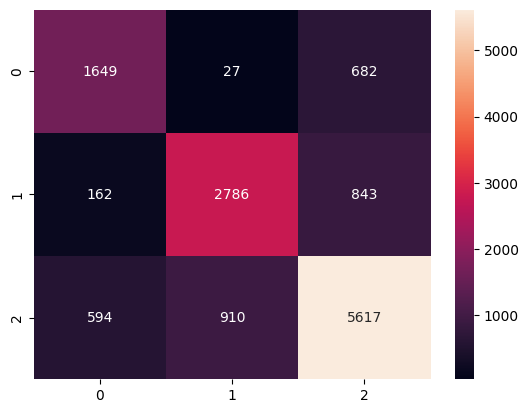

In [155]:
# Random Forest
rf = RandomForestClassifier()

rf.fit(x_train_processed, y_train)
sns.heatmap(confusion_matrix(y_test, rf.predict(x_test_processed)), annot=True, fmt='.0f')

In [156]:
print(classification_report(y_test, rf.predict(x_test_processed), target_names=['Good', 'Standard',"Poor"], zero_division=0))

              precision    recall  f1-score   support

        Good       0.69      0.70      0.69      2358
    Standard       0.75      0.73      0.74      3791
        Poor       0.79      0.79      0.79      7121

    accuracy                           0.76     13270
   macro avg       0.74      0.74      0.74     13270
weighted avg       0.76      0.76      0.76     13270



In [ ]:
# Tuning
#from sklearn.model_selection import GridSearchCV

#grid = {
    #'n_estimators': [300, 500],
    #'max_depth': [ 15, 17, 19],
#}

#grid_search = GridSearchCV(rf, grid, cv=5, scoring='precision_weighted', n_jobs=-1)

#grid_search.fit(x_sample, y_sample)

#grid_search.best_params_

In [157]:
#Method to evaluate the performance of the model
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
import xgboost as xgb
import matplotlib.pyplot as plt
import seaborn as sns

def evaluate_model(y_test,y_pred):
    print("Classification Report")
    print(classification_report(y_test, y_pred))
    
    print("\n---------------------------------------------\n")
    # Compute confusion matrix
    cm = confusion_matrix(y_test, y_pred)

    # Create a heatmap of the confusion matrix using Seaborn
    sns.heatmap(cm, annot=True, cmap='Greens',fmt='.0f')

    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')

plt.show()
# List of classifiers to test
classifiers = [
    ('Decision Tree', DecisionTreeClassifier()),
    ('Random Forest', RandomForestClassifier()),
    ('KNN', KNeighborsClassifier(n_neighbors=5)),
    ('Gaussion NB',GaussianNB()),
    ('XGB',xgb.XGBClassifier())
]

# Iterate over each classifier and evaluate performance
for clf_name, clf in classifiers:
    # Perform cross-validation
    scores = cross_val_score(clf, x_train_processed, y_train, cv=5, scoring='accuracy')
    
    # Calculate average performance metrics
    avg_accuracy = scores.mean()
    avg_precision = cross_val_score(clf, x_train_processed, y_train, cv=5, scoring='precision_macro').mean()
    avg_recall = cross_val_score(clf, x_train_processed, y_train, cv=5, scoring='recall_macro').mean()
    
    # Print the performance metrics
    print(f'Classifier: {clf_name}')
    print(f'Average Accuracy: {avg_accuracy:.4f}')
    print(f'Average Precision: {avg_precision:.4f}')
    print(f'Average Recall: {avg_recall:.4f}')
    print("\n---------------------------------------------\n")
   

Classifier: Decision Tree
Average Accuracy: 0.6767
Average Precision: 0.6510
Average Recall: 0.6481

---------------------------------------------

Classifier: Random Forest
Average Accuracy: 0.7439
Average Precision: 0.7207
Average Recall: 0.7197

---------------------------------------------

Classifier: KNN
Average Accuracy: 0.6181
Average Precision: 0.5846
Average Recall: 0.5876

---------------------------------------------

Classifier: Gaussion NB
Average Accuracy: 0.3372
Average Precision: 0.4523
Average Recall: 0.5120

---------------------------------------------

Classifier: XGB
Average Accuracy: 0.7205
Average Precision: 0.6995
Average Recall: 0.6943

---------------------------------------------



## Confusion_Matrix for KNN

Classification Report
              precision    recall  f1-score   support

           0       0.49      0.54      0.52      2358
           1       0.60      0.55      0.58      3791
           2       0.68      0.69      0.69      7121

    accuracy                           0.62     13270
   macro avg       0.59      0.60      0.59     13270
weighted avg       0.63      0.62      0.62     13270


---------------------------------------------



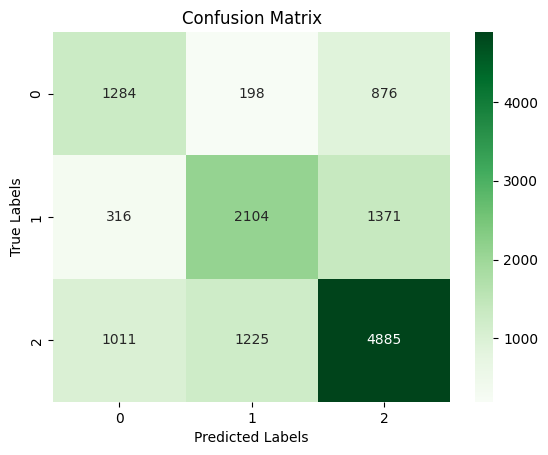

In [158]:
# Creating the KNeighborsClassier
knn = KNeighborsClassifier(n_neighbors=5)

# Training the classifier
knn.fit(x_train_processed, y_train)

# Making predictions on the test set
y_pred = knn.predict(x_test_processed)

# Evaluating the model
evaluate_model(y_test, y_pred)

## Confusion_Matrix for Random Forest 

Classification Report
              precision    recall  f1-score   support

           0       0.68      0.68      0.68      2358
           1       0.75      0.73      0.74      3791
           2       0.78      0.79      0.79      7121

    accuracy                           0.76     13270
   macro avg       0.74      0.74      0.74     13270
weighted avg       0.76      0.76      0.76     13270


---------------------------------------------



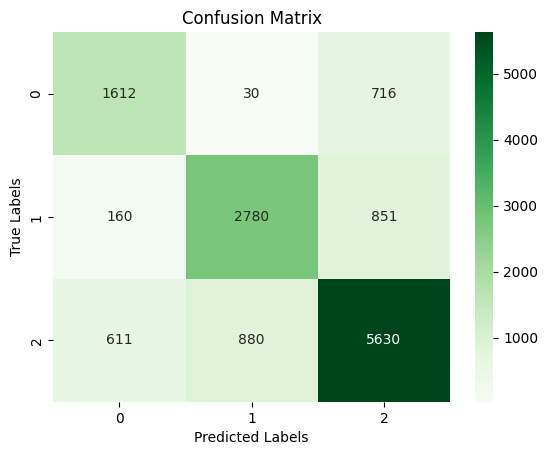

In [159]:
# Creating the Random Forest classifier
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

# Training the classifier
rf_classifier.fit(x_train_processed, y_train)



# Making predictions on the test set
y_pred = rf_classifier.predict(x_test_processed)

# Evaluating the model
evaluate_model(y_test, y_pred)

## Confusion_Matrix for Decision Tree

Classification Report
              precision    recall  f1-score   support

           0       0.61      0.61      0.61      2358
           1       0.67      0.66      0.66      3791
           2       0.73      0.74      0.73      7121

    accuracy                           0.69     13270
   macro avg       0.67      0.67      0.67     13270
weighted avg       0.69      0.69      0.69     13270


---------------------------------------------



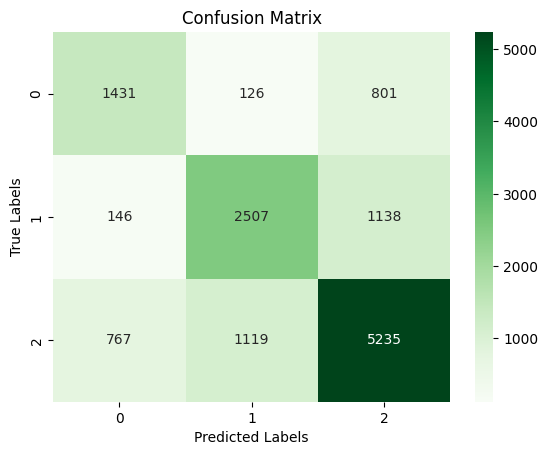

In [160]:
DecisionTreeClassifier()
# Creating the Decision Tree classifier
DT = DecisionTreeClassifier()

# Training the classifier
DT.fit(x_train_processed, y_train)

# Making predictions on the test set
y_pred = DT.predict(x_test_processed)


# Evaluating the model
evaluate_model(y_test, y_pred)

## Confusion_Matrix for XGBoost

Classification Report
              precision    recall  f1-score   support

           0       0.65      0.67      0.66      2358
           1       0.74      0.69      0.71      3791
           2       0.76      0.78      0.77      7121

    accuracy                           0.74     13270
   macro avg       0.72      0.72      0.72     13270
weighted avg       0.74      0.74      0.74     13270


---------------------------------------------



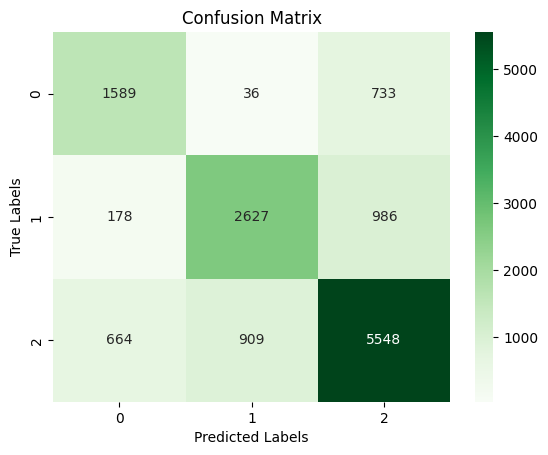

In [161]:
from xgboost import XGBClassifier


# Creating the XGBClassifier()
XGB = XGBClassifier()

# Training the classifier
XGB.fit(x_train_processed, y_train)

# Making predictions on the test set
y_pred = XGB.predict(x_test_processed)


# Evaluating the model
evaluate_model(y_test, y_pred)

`This is the best model we got. `

In [ ]:
     #from sklearn.linear_model import LogisticRegression
     #from sklearn.neighbors import KNeighborsClassifier
     #from sklearn.model_selection import cross_validate
     #from sklearn.svm import SVC
     #from sklearn.tree import DecisionTreeClassifier
     #from sklearn.ensemble import RandomForestClassifier
     #from xgboost import XGBClassifier

     #models = []
     #
     #models.append(('Logistic Regression', LogisticRegression()))
     #models.append(('Knn', KNeighborsClassifier()))
     #models.append(('Decision Tree', DecisionTreeClassifier()))
     #models.append(('Random Forest', RandomForestClassifier()))
     #models.append(('Xgboost',XGBClassifier()))

     #for model in models:
     
          #pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('Model', model[1])])
          #result = cross_validate(pipeline, x_sample, y_sample, cv= 2, scoring= 'accuracy', return_train_score= True, n_jobs= -1)
          
          #print(model[0])

          #print('Train Accuracy Score : ', result['train_score'].mean() * 100)
          #print('Test Accuracy Score : ', result['test_score'].mean() * 100, '\n')

     
  

    

        

    

In [166]:

from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc
from sklearn.multiclass import OneVsRestClassifier
import seaborn as sns

# For KNN
y_pred_prob_knn = knn.predict(x_test_processed)
fpr_knn, tpr_knn, _ = roc_curve(y_test, y_pred_prob_knn)
roc_auc_knn = auc(fpr_knn, tpr_knn)

# For Random Forest 
y_pred_prob_rf_classifier= rf_classifier.predict(x_test_processed)
fpr_rf_classifier, tpr_rf_classifier, _ = roc_curve(y_test, y_pred_prob_rf_classifier)
roc_auc_rf_classifier = auc(fpr_rf_classifier, tpr_rf_classifier)

# For Decision Tree 
y_pred_prob_DT= y_pred = DT.predict(x_test_processed)
fpr_DT, tpr_DT, _ = roc_curve(y_test, y_pred_prob_DT)
roc_auc_DT = auc(fpr_DT, tpr_DT)

# For XGBoost
y_pred_prob_XGB= y_pred = XGB.predict(x_test_processed)
fpr_XGB, tpr_XGB, _ = roc_curve(y_test, y_pred_prob_XGB)
roc_auc_XGB = auc(fpr_XGB, tpr_XGB)

# Plotting ROC curves
plt.figure(figsize=(10, 6))
plt.plot(fpr_log, tpr_log, color='red', lw=2, label=f'Decision Tree (area = {roc_auc_DT:.3f})')
plt.plot(fpr_knn, tpr_knn, color='blue', lw=2, label=f'KNN (area = {roc_auc_knn:.3f})')
plt.plot(fpr_log, tpr_log, color='yellow', lw=2, label=f'Random Forest (area = {roc_auc_rf_classifier:.3f})')
plt.plot(fpr_log, tpr_log, color='darkorange', lw=2, label=f'XGBoost (area = {roc_auc_XGB:.3f})')
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

# Confusion Matrices
#cm_log = confusion_matrix(y_test, y_pred)
#cm_knn = confusion_matrix(y_test, y_pred_knn)

#cm_log, cm_knn

## ROC curve and AUC for KNN

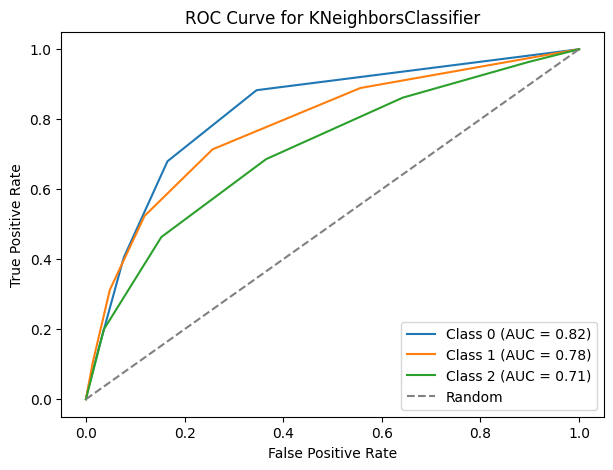

In [171]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt



# Create a KNeighborsClassifier instance
knn_classifier = KNeighborsClassifier()

# Fit the model on the training data
knn_classifier.fit(x_train_processed, y_train)

# Predict probabilities for each class using decision function
y_pred_prob_knn = knn_classifier.predict_proba(x_test_processed)

# Compute ROC curve and AUC for each class
n_classes = len(knn_classifier.classes_)
fpr, tpr, roc_auc = {}, {}, {}

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test == i, y_pred_prob_knn[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot the ROC curves
plt.figure(figsize=(7, 5))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for KNeighborsClassifier')
plt.legend()
plt.show()


## ROC curve and AUC for Random Forest

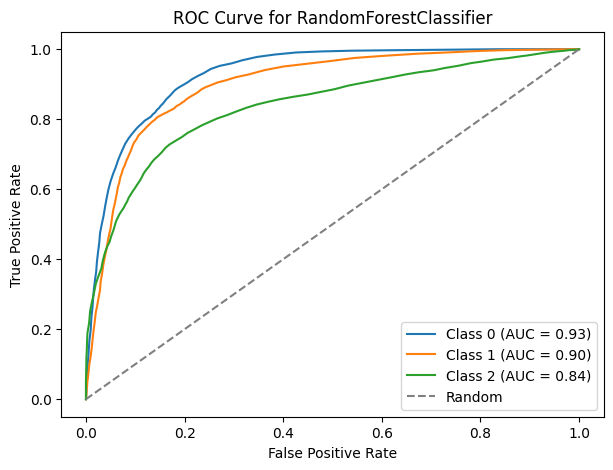

In [172]:
# Creating the Random Forest classifier
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

# Fit the model on the training data
rf_classifier.fit(x_train_processed, y_train)

# Predict probabilities for each class using decision function
y_pred_prob_rf_classifier= rf_classifier.predict_proba(x_test_processed)

# Compute ROC curve and AUC for each class
n_classes = len(DT.classes_)
fpr, tpr, roc_auc = {}, {}, {}

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test == i, y_pred_prob_rf_classifier[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot the ROC curves
plt.figure(figsize=(7, 5))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for RandomForestClassifier')
plt.legend()
plt.show()

## ROC curve and AUC for Decision Tree

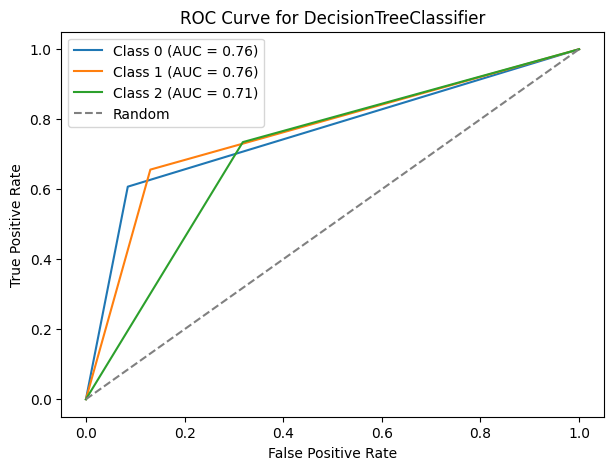

In [173]:
# Creating the Decision Tree classifier
DT = DecisionTreeClassifier()

# Fit the model on the training data
DT.fit(x_train_processed, y_train)

# Predict probabilities for each class using decision function
y_pred_prob_DT= DT.predict_proba(x_test_processed)

# Compute ROC curve and AUC for each class
n_classes = len(DT.classes_)
fpr, tpr, roc_auc = {}, {}, {}

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test == i, y_pred_prob_DT[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot the ROC curves
plt.figure(figsize=(7, 5))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for DecisionTreeClassifier')
plt.legend()
plt.show()

## ROC curve and AUC for XGBoost

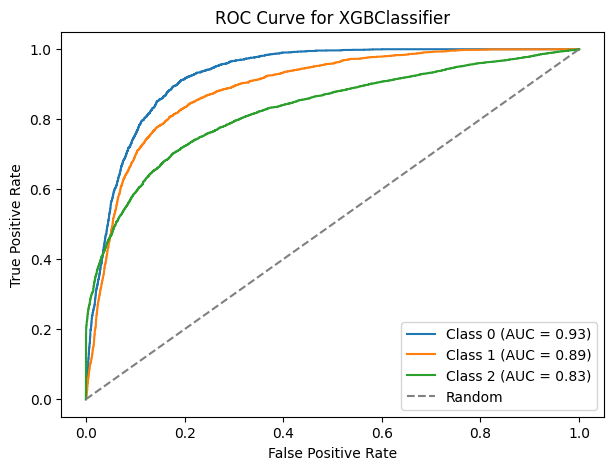

In [174]:

# Create a XGBClassifier
XGB = XGBClassifier()

# Fit the model on the training data
XGB.fit(x_train_processed, y_train)

# Predict probabilities for each class using decision function
y_pred_prob_XGB= XGB.predict_proba(x_test_processed)

# Compute ROC curve and AUC for each class
n_classes = len(XGB.classes_)
fpr, tpr, roc_auc = {}, {}, {}

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test == i, y_pred_prob_XGB[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot the ROC curves
plt.figure(figsize=(7, 5))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for XGBClassifier')
plt.legend()
plt.show()


## Future Importance XGBoost

In [175]:
XGB.feature_importances_

array([0.00300663, 0.00366292, 0.00321492, 0.00716622, 0.00827261,
       0.0133959 , 0.0027533 , 0.00804596, 0.00445577, 0.02717227,
       0.00212393, 0.00422297, 0.00243343, 0.00392768, 0.00276937,
       0.00559481, 0.0039368 , 0.00957538, 0.01154017, 0.00405663,
       0.0015081 , 0.00978501, 0.00212541, 0.00289873, 0.00360435,
       0.00336245, 0.00327352, 0.00353772, 0.00380988, 0.00266256,
       0.0036794 , 0.00378487, 0.00224569, 0.00340081, 0.00258534,
       0.00263543, 0.00346   , 0.00171238, 0.116744  , 0.10919084,
       0.02810885, 0.        , 0.        , 0.00089636, 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.00162622, 0.00166278, 0.        , 0.        ,
       0.        , 0.00117369, 0.00147975, 0.00214514, 0.00423986,
       0.        , 0.        , 0.        , 0.        , 0.00137337,
       0.        , 0.        , 0.        , 0.00089735, 0.        ,
       0.00229611, 0.00108197, 0.00340175, 0.        , 0.00103

In [ ]:
#rf.feature_importances_


In [176]:
preprocessor.get_feature_names_out()

array(['num__Age', 'num__Annual_Income', 'num__Monthly_Inhand_Salary',
       'num__Num_Bank_Accounts', 'num__Num_Credit_Card',
       'num__Interest_Rate', 'num__Num_of_Loan',
       'num__Delay_from_due_date', 'num__Num_Credit_Inquiries',
       'num__Outstanding_Debt', 'num__Credit_Utilization_Ratio',
       'num__Total_EMI_per_month', 'num__Monthly_Balance',
       'num__Num_of_Delayed_Payment', 'num__Amount_invested_monthly',
       'num__Changed_Credit_Limit', 'cat__Month_1', 'cat__Month_2',
       'cat__Month_3', 'cat__Month_4', 'cat__Month_5', 'cat__Month_6',
       'cat__Month_7', 'cat__Occupation_1', 'cat__Occupation_2',
       'cat__Occupation_3', 'cat__Occupation_4', 'cat__Occupation_5',
       'cat__Occupation_6', 'cat__Occupation_7', 'cat__Occupation_8',
       'cat__Occupation_9', 'cat__Occupation_10', 'cat__Occupation_11',
       'cat__Occupation_12', 'cat__Occupation_13', 'cat__Occupation_14',
       'cat__Occupation_15', 'cat__Credit_Mix_1', 'cat__Credit_Mix_2',
     

In [177]:
import_df = pd.DataFrame( {'Features' : preprocessor.get_feature_names_out(), 'Importance' : XGB.feature_importances_} ).sort_values(by= 'Importance',ascending= False)
import_df

,Features,Importance
38,cat__Credit_Mix_1,0.116744
39,cat__Credit_Mix_2,0.109191
40,cat__Credit_Mix_3,0.028109
9,num__Outstanding_Debt,0.027172
444,cat__Payment_of_Min_Amount_1,0.017171
...,...,...
127,cat__Credit_History_Age_87,0.000000
73,cat__Credit_History_Age_33,0.000000
129,cat__Credit_History_Age_89,0.000000
69,cat__Credit_History_Age_29,0.000000


In [211]:
# Assuming you have imported and initialized your XGBoost classifier as 'clf'

# Fit the model to your training data
clf.fit(x_train, y_train)

# Now you can access the feature importances
importances = clf.feature_importances_


In [212]:
clf.feature_importances_

array([0.02518001, 0.01169988, 0.010764  , 0.01407773, 0.01188664,
       0.01816611, 0.03009231, 0.05196434, 0.01073983, 0.03107885,
       0.01413795, 0.01911276, 0.01545524, 0.17149453, 0.08105429,
       0.00825315, 0.0112081 , 0.41516325, 0.01428323, 0.01026002,
       0.01410075, 0.00982704, 0.        , 0.        ], dtype=float32)

In [213]:
print(len(clf.feature_importances_))  # Should match the number of features
print(len(X.columns))  # Should also match the number of features


24
24


<Axes: xlabel='None', ylabel='None'>

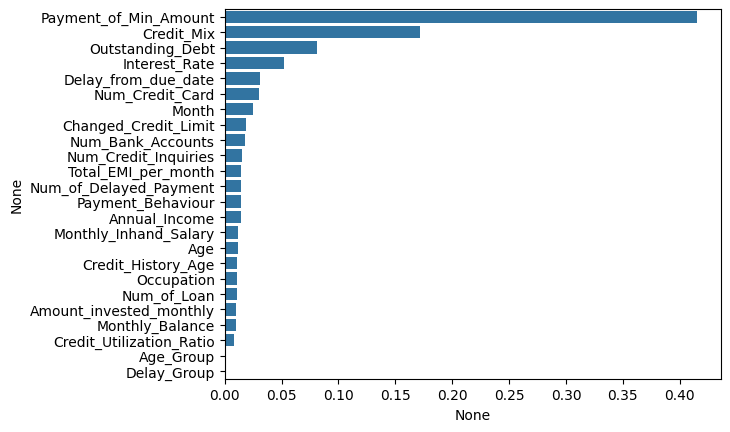

In [216]:
# plot feature importance in descending order
feature_imp = pd.Series(clf.feature_importances_, index=X.columns).sort_values(ascending=False)

# Creating a bar plot
sns.barplot(x=feature_imp, y=feature_imp.index)

Here we can see overall, Credit Score is explained mostly by Late payment, Debt, Credit Mix and Delay from due date. The class Standard is affected relatively equally with other classes in many features. This explains the high confusion for Standard Score class.

In [185]:
clf.score(x_test_processed, y_test)

0.7357950263752826

## Saving 

In [186]:
# Preprocessor Saving
import pickle
pickle.dump(preprocessor, open('preprocessor.pkl', 'wb'))

# Model Saving
pickle.dump(XGB, open('model.pkl', 'wb'))

In [187]:
# Inferencing

# Load Preprocessor
preprocessor = pickle.load(open('preprocessor.pkl', 'rb'))
model = pickle.load(open('model.pkl', 'rb'))

In [188]:
# Preprocessing
new_data = x_test.sample(1)
new_data

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,...,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Age_Group,Delay_Group
8857,2,33.0,2,91308.16,7781.013333,3.0,7.0,17.0,3.0,15.0,...,1382.62,38.18895,322,1,217.261483,50.857169,0,749.982681,2,1


In [190]:
print(y_test.index)


Index([68759, 28131, 55528, 52604, 53675, 48357, 84279, 45419, 92208, 72584,
       ...
       15866, 85953, 57284, 72172, 92877, 25484, 29514, 92831, 77392, 66863],
      dtype='int64', length=13270)


In [192]:
np.expm1(y_test[new_data.index])

8857    6.389056
Name: Credit_Score, dtype: float64

In [195]:
y_test[new_data.index]

8857    2
Name: Credit_Score, dtype: int32

In [196]:
np.expm1(y_test[new_data.index])

8857    6.389056
Name: Credit_Score, dtype: float64

In [197]:
# Preprocessing & Prediction
new_data_preprocessed = preprocessor.transform(new_data)
Credit_Score = model.predict(new_data_preprocessed) # in log scale
Credit_Score1 =np.expm1(Credit_Score) # in original scale
 

print('Credit_Score:',Credit_Score1 )

Credit_Score: [6.3890561]


In [ ]:
# Assuming you have imported and initialized your XGBoost classifier as 'clf'

# Get the tree dump as a list of strings
#tree_dump = clf.get_booster().get_dump()

# The depth of each tree can be extracted from the tree_dump
#tree_depths = [tree.count('\t') for tree in tree_dump]

# Print the depths of individual trees
#for i, depth in enumerate(tree_depths):
    #print(f"Tree {i + 1} depth: {depth}")


In [198]:
df.to_csv('CreditScoreClassification.csv', index= False)

## Conclusion¶
    Standard class has many overlap features with other classes.
    Age explains for some of Credit Score indirectly.
    SHAP assume features are independent, and it explains the feature importance to the model not to the real world.
    Future fixes

    Identify or create signature feature for Standard Credit Scorers. Then put more weight on that feature for Standard Class in future models.
    Maybe we can calculate actual Credit Score base on features which will provide a wider range of continuous values rather than 3 discreet Score values.

In [199]:
# Extract Data for Deployment
Age = df.Age.unique().tolist()
Month = df.Month.unique().tolist()
Annual_Income = df.Annual_Income.unique().tolist()
Total_EMI_per_month = df.Total_EMI_per_month.unique().tolist()
Monthly_Inhand_Salary = df.Monthly_Inhand_Salary.unique().tolist()
Num_Bank_Accounts = df.Num_Bank_Accounts.unique().tolist()
Monthly_Balance = df.Monthly_Balance.unique().tolist()
Credit_Utilization_Ratio = df.Credit_Utilization_Ratio.unique().tolist()
Num_Credit_Inquiries = df.Num_Credit_Inquiries.unique().tolist()
Payment_Behaviour = df.Payment_Behaviour.unique().tolist()
Num_Credit_Inquiries = df.Num_Credit_Inquiries.unique().tolist()
Num_of_Loan = df.Num_of_Loan.unique().tolist()
Amount_invested_monthly = df.Amount_invested_monthly.unique().tolist()
Payment_of_Min_Amount = df.Payment_of_Min_Amount.unique().tolist()
Credit_History_Age = df.Credit_History_Age.unique().tolist()
Num_of_Delayed_Payment = df.Num_of_Delayed_Payment.unique().tolist()
Delay_from_due_date = df.Num_of_Delayed_Payment.unique().tolist()
Changed_Credit_Limit = df.Changed_Credit_Limit.unique().tolist()
Num_Credit_Card = df.Num_Credit_Card.unique().tolist()
Outstanding_Debt = df.Outstanding_Debt.unique().tolist()
Interest_Rate = df.Interest_Rate.unique().tolist()
Occupation = df.Occupation.unique().tolist()
Age_Group = df.Age_Group.unique().tolist()
Interest_Rate = df.Interest_Rate.unique().tolist()
Delay_Group = df.Delay_Group.unique().tolist()
Credit_Mix = df.Credit_Mix.unique().tolist()


    
    
data = {'Age'                  :   Age,
        'Month'                 : Month,
        'Annual_Income'         : Annual_Income,
        'Monthly_Inhand_Salary' : Monthly_Inhand_Salary,
        'Monthly_Balance'       : Monthly_Balance,
        'Credit_Utilization_Ratio':Credit_Utilization_Ratio,
        'Occupation'            : Occupation,
        'Credit_History_Age'    :Credit_History_Age,
        'Payment_of_Min_Amount' : Payment_of_Min_Amount,
        'Age_Group'             : Age_Group,
        'Delay_Group'           :Delay_Group,
        'Num_Credit_Inquiries'  : Num_Credit_Inquiries,
        'Num_of_Loan'           : Num_of_Loan,
        'Amount_invested_monthly': Amount_invested_monthly,
        'Payment_Behaviour'     : Payment_Behaviour,
        'Total_EMI_per_month'   : Total_EMI_per_month,
        'Num_Bank_Accounts'     : Num_Bank_Accounts,
        'Num_of_Delayed_Payment': Num_of_Delayed_Payment, 
        'Delay_from_due_date'   : Delay_from_due_date,
        'Changed_Credit_Limit'  : Changed_Credit_Limit,
        'Num_Credit_Card'       : Num_Credit_Card,        
        'Outstanding_Debt'      : Outstanding_Debt,
        'Interest_Rate'         : Interest_Rate,       
        'Credit_Mix'            : Credit_Mix,
        
        }
    
    
pickle.dump(data, open('data_for_deploy.pkl', 'wb'))


## Streamlit


In [200]:
%%writefile app.py
import streamlit as st
import pickle
import pandas as pd
import time
from PIL import Image
import streamlit.components.v1 as components
import os


from xgboost import XGBClassifier


data=  pickle.load(open('data_for_deploy.pkl', 'rb'))
#loaded_model = XGBClassifier()

# Model Saving
#file_path = os.path.abspath('F:/data science/Final_Project_Criteria_Dataset/preprocessor.pkl')

# Load Preprocessor
 

#loaded_le = pickle.load(open('F:/data science/Final_Project_Criteria_Dataset/preprocessor.pkl', 'rb'))
#loaded_enc = pickle.load(open('F:/data science/Final_Project_Criteria_Dataset/model.pkl', 'rb'))

#df[cat] = ['Credit_Mix']





col1, col2, col3 = st.columns([1,8,1]) 

    #try:
    #image url
url = "https://storage.googleapis.com/kaggle-datasets-images/2289007/3846912/ad5e128929f5ac26133b67a6110de7c0/dataset-cover.jpg?"
    
    #Image, df

st.image(url, caption="Kaggle: Credit score classification")        
st.markdown('[Kaggle: Credit Score Classification  Dataset](https://www.kaggle.com/datasets/parisrohan/credit-score-classification/data)')
        
 #Define User input
def user_input_data():
    # Sidebar Configuration
    Age = st.number_input('Age', min_value=18, max_value=100)
    Month = st.number_input('Month', min_value=1, max_value=8 )
    Annual_Income = st.number_input('Annual_Income', min_value=0.00, max_value=300000.00)
    Monthly_Inhand_Salary       = st.sidebar.slider('Monthly_Inhand_Salary',min_value=2000, max_value=20000)
    Monthly_Balance       = st.sidebar.slider('Monthly_Inhand_Salary',min_value=500, max_value=20000)
    Total_EMI_per_month    = st.number_input('Total_EMI_per_month', min_value=0.00, max_value=5000.00)
    Num_Bank_Accounts      = st.number_input('Num_Bank_Accounts', min_value=0, max_value=20)
    Num_Credit_Inquiries       = st.sidebar.slider('Num_Credit_Inquiries',min_value=0, max_value=20000)
    Credit_History_Age       = st.number_input('Credit_History_Age', min_value=0, max_value=500)
    Num_of_Loan       = st.sidebar.slider('Num_of_Loan',min_value=0.00, max_value=12.0)
    Num_of_Delayed_Payment = st.sidebar.slider('Num_of_Delayed_Payment', 0, 25, 14, 1)
    Payment_Behaviour = st.sidebar.slider('Payment_Behaviour', min_value=1, max_value=6) 
    Credit_Utilization_Ratio = st.slider('Credit_Utilization_Ratio', min_value=0.00, max_value=100.00)
    Delay_from_due_date = st.number_input('Delay_from_due_date', min_value=0, max_value=20)
    Changed_Credit_Limit   = st.sidebar.slider('Changed_Credit_Limit', 0.5, 30.0, 9.40, 0.1)
    Amount_invested_monthly= st.number_input('Amount_invested_monthly', min_value=0, max_value=20)
    Num_Credit_Card        = st.number_input('Num_Credit_Card', min_value=0, max_value=12)
    Outstanding_Debt       = st.sidebar.slider('Outstanding_Debt', 0.0, 5000.0, 1426.0, 0.1)
    Interest_Rate          = st.sidebar.slider('Interest_Rate', 1, 34, 14, 1)   
    Age_Group          = st.sidebar.slider('Age_Group',  min_value=1, max_value=4)
    Delay_Group          = st.sidebar.slider('Delay_Group', min_value=1, max_value=4)
    #Credit_Mix             = st.sidebar.selectbox('Credit_Mix:', ['Standard', 'Bad', 'Good'])    
    Credit_Mix             = st.sidebar.slider('Credit_Mix:', min_value=0, max_value=2)
    Occupation             = st.number_input('Month', min_value=1, max_value=15 )
    Payment_of_Min_Amount = st.number_input('Payment_of_Min_Amount', min_value=0, max_value=2)
    
    
    
    html_temp = """
    <div style="background-color:tomato;padding:1.5px">
    <h1 style="color:white;text-align:center;">Single Customer </h1>
    </div><br>"""
    st.sidebar.markdown(html_temp,unsafe_allow_html=True)
    

    new_data = {'Age'                  :   Age,
                'Month'                 : Month,
                'Occupation'            : Occupation,
                'Credit_History_Age'    : Credit_History_Age,
                'Payment_of_Min_Amount' : Payment_of_Min_Amount,
                'Age_Group'             : Age_Group,
                'Delay_Group'           : Delay_Group,
                'Annual_Income'         : Annual_Income,
                'Monthly_Inhand_Salary' : Monthly_Inhand_Salary,
                'Monthly_Balance'       : Monthly_Balance,
                'Credit_Utilization_Ratio':Credit_Utilization_Ratio,
        
                'Num_Credit_Inquiries'  : Num_Credit_Inquiries,
                'Num_of_Loan'           : Num_of_Loan,
                'Amount_invested_monthly': Amount_invested_monthly,
                'Payment_Behaviour'     : Payment_Behaviour,
                'Total_EMI_per_month'   : Total_EMI_per_month,
                'Num_Bank_Accounts'     : Num_Bank_Accounts,
                'Num_of_Delayed_Payment': Num_of_Delayed_Payment, 
                'Delay_from_due_date'   : Delay_from_due_date,
                'Changed_Credit_Limit'  : Changed_Credit_Limit,
                'Num_Credit_Card'       : Num_Credit_Card,        
                'Outstanding_Debt'      : Outstanding_Debt,
                'Interest_Rate'         : Interest_Rate,       
                'Credit_Mix'            : Credit_Mix,
        
         
    }
    input_data = pd.DataFrame(new_data, index=[0])  
    
    return input_data
    
# Sidebar Configuration
# Add a sidebar to the web page. 
st.sidebar.header("User input parameter")

# get input datas
col1, col2 = st.columns([4, 6])
# st.sidebar.write('Developed by ...')
# st.sidebar.write('Contact at ...')


df = user_input_data() 
with col1:
    if st.checkbox('Show User Inputs:', value=True):
        st.dataframe(df.astype(str).T.rename(columns={0:'input_data'}).style.highlight_max(axis=0))

with col2:
    for i in range(2): 
        st.markdown('#')
    if st.button('Make Prediction'):   
        sound = st.empty()
        # assign for music sound
        video_html = """
            <iframe width="0" height="0" 
            src="https://www.youtube-nocookie.com/embed/t3217H8JppI?rel=0&amp;autoplay=1&mute=0&start=2860&amp;end=2866&controls=0&showinfo=0" 
            allow="autoplay;"></iframe>
            """
        sound.markdown(video_html, unsafe_allow_html=True)
        
        
        # Use the loaded model for predictions
        #df[cat]    = loaded_enc.transform(df[cat]) 
        #prediction = loaded_model.predict(df)
        #prediction = loaded_le.inverse_transform(prediction)[0]
        
        preprocessor = pickle.load(open('preprocessor.pkl', 'rb'))
        df_preprocessed = preprocessor.transform(df)   
        model = pickle.load(open('model.pkl', 'rb'))
        Credit_Score = model.predict(df_preprocessed) 
        #Credit_Score1 =np.expm1(Credit_Score)
        #Credit_Score1 =loaded_le.inverse_transform(Credit_Score)[0]

        time.sleep(3.7)  # wait for 2 seconds to finish the playing of the audio
        sound.empty()  # optionally delete the element afterwards   
        
        st.success(f'Credit score probability is:&emsp;{Credit_Score}')



Overwriting app.py


In [ ]:
! streamlit run app.py

^C


In [ ]:
!pip install pipreqs


[notice] A new release of pip is available: 23.2.1 -> 23.3.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
!pipreqs .

Please, verify manually the final list of requirements.txt to avoid possible dependency confusions.
Please, verify manually the final list of requirements.txt to avoid possible dependency confusions.
INFO: Successfully saved requirements file in .\requirements.txt


In [ ]:

pip install --upgrade pip

  Using cached pip-23.3.2-py3-none-any.whl (2.1 MB)
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.0.1 -> 23.3.2
[notice] To update, run: C:\Users\Acer\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip
